# **Project Name-** Netflix movies and tv show clustering

**Project Type** - Unsupervised

**Contribution** - Individual

**Name** - Susanta Adhikary

# **Project** **Summary** -



Netflix, the world’s largest on-demand internet streaming media and online DVD movie rental service provider.it Founded August 29, 1997, in Los Gatos, California by Marc and Reed. It has 69 million members in over 60 countries enjoying more than 100 million hours of TV shows and movies per day Netflix is the world’s leading internet entertainment service with enjoying TV series, documentaries, and feature films across a wide variety of genres and languages. I was curious to analyze the content released in Netflix platform which led me to create these simple, interactive, and exciting visualizations and find similar groups of people.

This dataset consists of tv shows and movies available on Netflix as of 2019. The dataset is collected from Fixable which is a third-party Netflix search engine. In 2018, they released an interesting report which shows that the number of TV shows on Netflix has nearly tripled since 2010. The streaming service’s number of movies has decreased by more than 2,000 titles since 2010, while its number of TV shows has nearly tripled. It will be interesting to explore what all other insights can be obtained from the same dataset. Integrating this dataset with other external datasets such as IMDB ratings, rotten tomatoes can also provide many interesting findings.



**In this project, you are required to do**

Exploratory Data Analysis.

dealing with missing value and outliers.

Understanding what type content is available in different countries.

Is Netflix has increasingly focusing on TV rather than movies in recent years.

brief strategy for cluster formed.

conclusion

# **GitHub Link -**
  https://github.com/susantaadhikary/Netflix_and_tv_show_clustering

# **Problem Statement :-**
This dataset consists of tv shows and movies available on Netflix as of 2019. The dataset is collected from Flixable which is a third-party Netflix search engine.

In 2018, they released an interesting report which shows that the number of TV shows on Netflix has nearly tripled since 2010. The streaming service’s number of movies has decreased by more than 2,000 titles since 2010, while its number of TV shows has nearly tripled. It will be interesting to explore what all other insights can be obtained from the same dataset.

Integrating this dataset with other external datasets such as IMDB ratings, rotten tomatoes can also provide many interesting findings.

# **General Guidelines : -**
Well-structured, formatted, and commented code is required.

Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits.

The additional credits will have advantages over other students during Star Student selection.

    [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
              without a single error logged. ]
Each and every logic should have proper comments.

You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.

# Chart visualization code
Why did you pick the specific chart?
What is/are the insight(s) found from the chart?
Will the gained insights help creating a positive business impact? Are there any insights that lead to negative growth? Justify with specific reason.
You have to create at least 15 logical & meaningful charts having important insights.
[ Hints : - Do the Vizualization in a structured way while following "UBM" Rule.

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis ]

You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.
Explain the ML Model used and it's performance using Evaluation metric Score Chart.
Cross- Validation & Hyperparameter Tuning

Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

Explain each evaluation metric's indication towards business and the business impact pf the ML model used.

# **Attribute Information**



1.   show_id : Unique ID for every Movie / Tv Show

2.   type : Identifier - A Movie or TV Show

3.   title : Title of the Movie / Tv Show

4.   director : Director of the Movie

5.   cast : Actors involved in the movie / show

6.   country : Country where the movie / show was produced

7.   date_added : Date it was added on Netflix

8.   release_year : Actual Releaseyear of the movie / show

9.   rating : TV Rating of the movie / show

10.  duration : Total Duration - in minutes or number of seasons

11.  listed_in : Genere

12.  description: The Summary description






# ***Let's Begin !***
First of all, import all required libraries like pandas, matplotlib,Sklearn,Scipy etc. These libraries are used to load, preprocess and visualize the dataset.Then loading data using the read_csv function of the pandas module.

## **1. Know Your Data**

# **Dataset loading and insert necessary packages**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#necessary packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import matplotlib.cm as cm

from os import path
from PIL import Image
from wordcloud import WordCloud,STOPWORDS, ImageColorGenerator


#for NLP
from sklearn import preprocessing
from sklearn.feature_extraction.text import  TfidfVectorizer, CountVectorizer
from sklearn.model_selection import train_test_split, KFold
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.cluster import KMeans
import scipy.cluster.hierarchy as sch

import re, string, unicodedata

import nltk
from bs4 import BeautifulSoup
from nltk import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import LancasterStemmer
from nltk.stem import WordNetLemmatizer

from sklearn.decomposition import PCA

from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
import string
string.punctuation
nltk.download('omw-1.4')
from nltk.tokenize import TweetTokenizer



from sklearn.cluster import KMeans

from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc


from sklearn.metrics.pairwise import cosine_similarity



import warnings
warnings.filterwarnings('ignore')




[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


**Dataset loading**

In [ ]:
#read the data
df= pd.read_csv('/content/drive/MyDrive/netflix recommendation system clustering/NETFLIX MOVIES AND TV SHOWS CLUSTERING.csv')

# **Understanding the variables**

# **Preliminary Analysis**

In [ ]:
#head of the dataset
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


In [ ]:
#tail of data
df.tail()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
7782,s7783,Movie,Zozo,Josef Fares,"Imad Creidi, Antoinette Turk, Elias Gergi, Car...","Sweden, Czech Republic, United Kingdom, Denmar...","October 19, 2020",2005,TV-MA,99 min,"Dramas, International Movies",When Lebanon's Civil War deprives Zozo of his ...
7783,s7784,Movie,Zubaan,Mozez Singh,"Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...",India,"March 2, 2019",2015,TV-14,111 min,"Dramas, International Movies, Music & Musicals",A scrappy but poor boy worms his way into a ty...
7784,s7785,Movie,Zulu Man in Japan,NaN,Nasty C,NaN,"September 25, 2020",2019,TV-MA,44 min,"Documentaries, International Movies, Music & M...","In this documentary, South African rapper Nast..."
7785,s7786,TV Show,Zumbo's Just Desserts,NaN,"Adriano Zumbo, Rachel Khoo",Australia,"October 31, 2020",2019,TV-PG,1 Season,"International TV Shows, Reality TV",Dessert wizard Adriano Zumbo looks for the nex...
7786,s7787,Movie,ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS,Sam Dunn,NaN,"United Kingdom, Canada, United States","March 1, 2020",2019,TV-MA,90 min,"Documentaries, Music & Musicals",This documentary delves into the mystique behi...


# **Dataset rows and coloums count**

In [ ]:
# basic info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


So we can see there are 7787 rows and12 coloums.

In [ ]:
#basic stat description
df.describe(include= 'all')

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
count,7787,7787,7787,5398,7069,7280,7777,7787.000000,7780,7787,7787,7787
unique,7787,2,7787,4049,6831,681,1565,NaN,14,216,492,7769
top,s1,Movie,3%,"Raúl Campos, Jan Suter",David Attenborough,United States,"January 1, 2020",NaN,TV-MA,1 Season,Documentaries,Multiple women report their husbands as missin...
freq,1,5377,1,18,18,2555,118,NaN,2863,1608,334,3
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013.932580,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.757395,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1925.000000,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013.000000,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2017.000000,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2018.000000,NaN,NaN,NaN,NaN


# **Check the duplicate values**

In [ ]:
df.duplicated().sum()

0

# **Checking for Missing Values/ Null Values**

In [ ]:
# Checking null values
df.isnull().sum().sort_values(ascending=False)

director        2389
cast             718
country          507
date_added        10
rating             7
show_id            0
type               0
title              0
release_year       0
duration           0
listed_in          0
description        0
dtype: int64

**We have 2389 null values in director, 718 in cast, 507 in country, 10 in date and 7 in rating coloum.**

<Axes: >

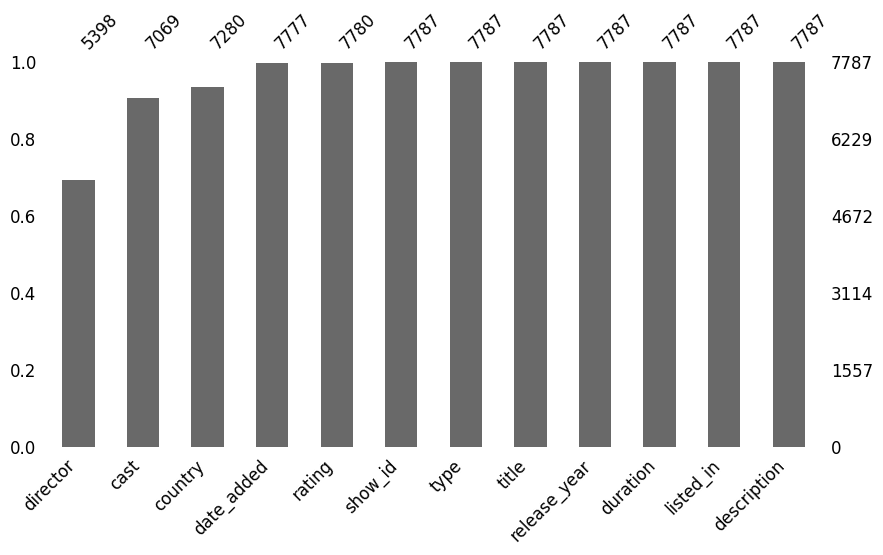

In [ ]:
# null value distribution
msno.bar(df,log=False, sort='ascending', figsize=(10,5), fontsize=12)

<BarContainer object of 12 artists>

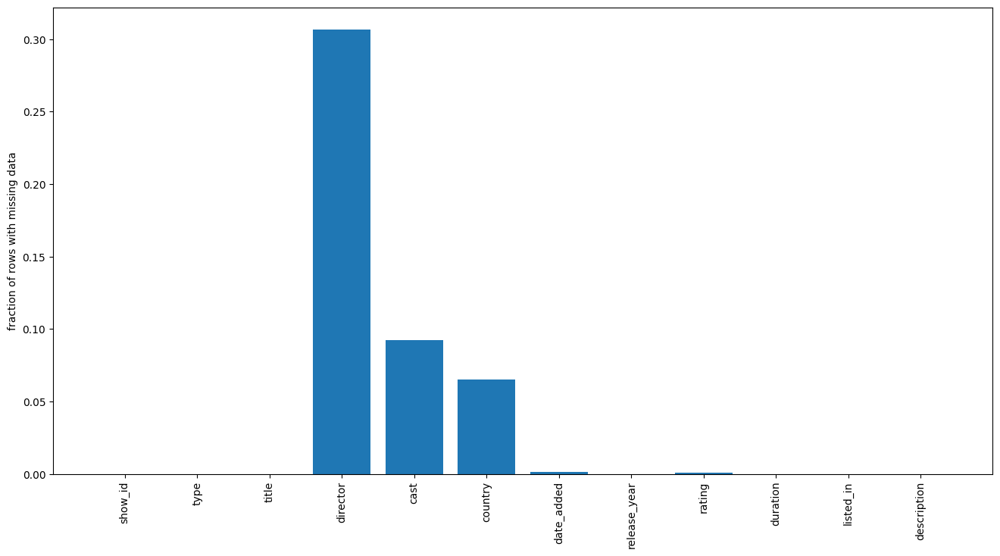

In [ ]:
# null value distribution
null_counts = df.isnull().sum()/len(df)
plt.figure(figsize=(16,8))
plt.xticks(np.arange(len(null_counts)),null_counts.index,rotation='vertical')
plt.ylabel('fraction of rows with missing data')
plt.bar(np.arange(len(null_counts)),null_counts)

<Axes: >

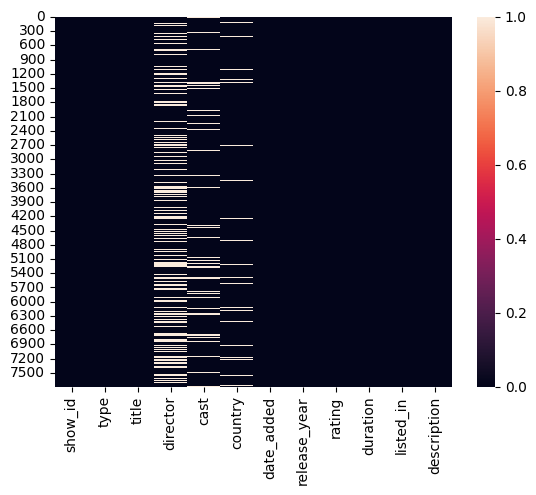

In [ ]:
sns.heatmap(df.isnull())

**Here we can also visualize same thing**


*   director,cast,country has many missing value also rating and date added has small missing values.



In [ ]:
#Looking for unique values
df.nunique()

show_id         7787
type               2
title           7787
director        4049
cast            6831
country          681
date_added      1565
release_year      73
rating            14
duration         216
listed_in        492
description     7769
dtype: int64

We know that from our data set

> 7787 rows and 12 coloum

> no duplicate rows

> We had 2389 null valuesin director,718 in cast,507 in country, 10 in date added and 7 in rating coloum.

> almost all coloums in dataset have unique values.










In [ ]:
# Dataset Columns
df.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

# .**Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables**

###**Univariate Analysis before Clustering**:




# 1. Type coloum

In [ ]:
df.type.value_counts()

Movie      5377
TV Show    2410
Name: type, dtype: int64

<Axes: xlabel='type', ylabel='count'>

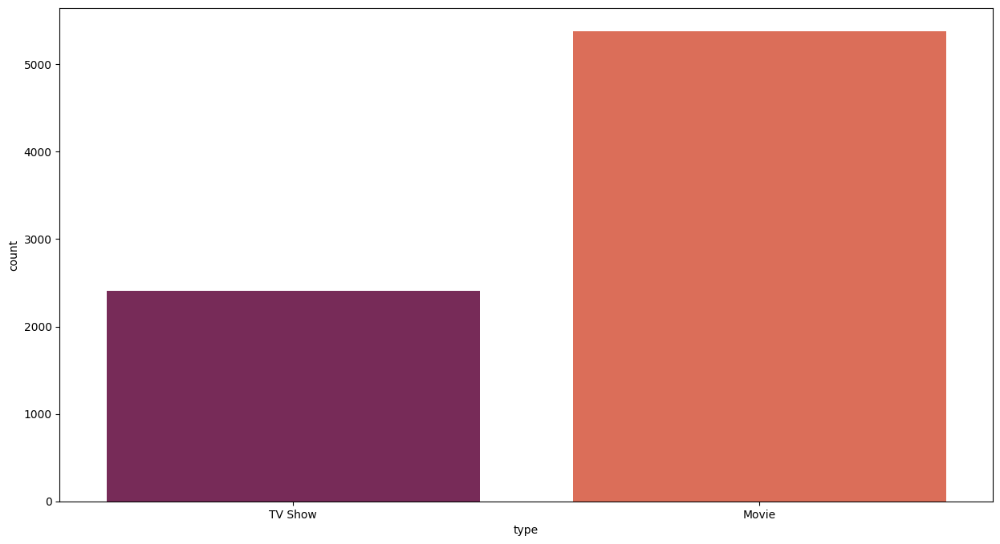

In [ ]:
plt.figure(figsize=(15,8))
sns.countplot(x='type',data=df, color='b',palette='rocket')

Text(0.5, 1.0, 'Movies and TV Shows in the dataset')

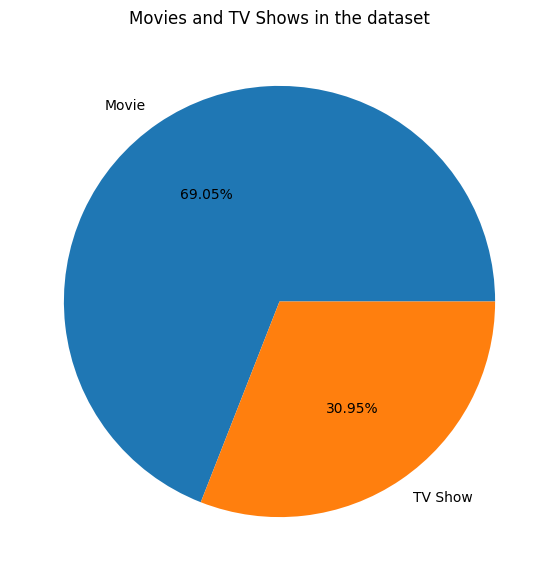

In [ ]:
#Better Visualization using Plotly
plt.figure(figsize=(7,7))
df.type.value_counts().plot(kind='pie',autopct='%1.2f%%')
plt.ylabel('')
plt.title('Movies and TV Shows in the dataset')

We can see that netflix almost 70% of datapoints belong to Movie, rest 30% to TV Show.

# 2. Ttile Column

In [ ]:
# number of unique points
df.title.nunique()

7787

In [ ]:
#word cloud imports
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

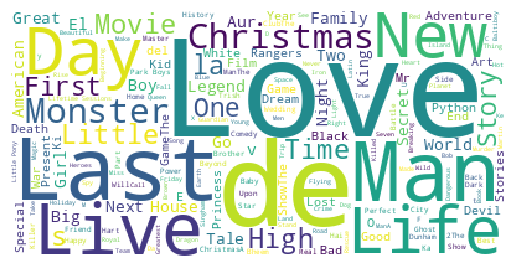

In [ ]:
df_wc=df['title']
text=''.join(i for i in df_wc)

#create stopword list
stopwords= set(STOPWORDS)

#generate a word cloud image
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

#display the generated images
plt.imshow(wordcloud,interpolation='nearest')
plt.axis('off')
plt.show()

**Inference**:

 It seems like words like "Love", "Man", "World", "Story", "day","monster" are very common in titles.

However, we are suprised by the overwhelming number of content having "Christmas" in their title.

We are suspecting "Christmas" titles to be a very seasonal thing with most of the shows likely to be released during the onth of December. However, we do not have the release month in this data to conform my hypothesis.

In [ ]:
df.title

0                                            3%
1                                          7:19
2                                         23:59
3                                             9
4                                            21
                         ...                   
7782                                       Zozo
7783                                     Zubaan
7784                          Zulu Man in Japan
7785                      Zumbo's Just Desserts
7786    ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS
Name: title, Length: 7787, dtype: object

# 3. Director

In [ ]:
#looking at director series
df.director

0                     NaN
1       Jorge Michel Grau
2            Gilbert Chan
3             Shane Acker
4          Robert Luketic
              ...        
7782          Josef Fares
7783          Mozez Singh
7784                  NaN
7785                  NaN
7786             Sam Dunn
Name: director, Length: 7787, dtype: object

In [ ]:
#number of unique dir
df.director.nunique()

4049

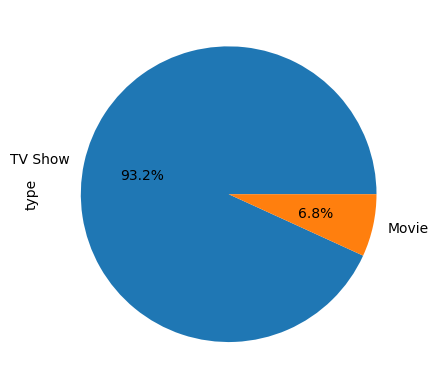

In [ ]:
missing_df=df[df['director'].isna()]
missing_df['type'].value_counts().plot.pie(autopct='%.1f%%')
plt.show()

In [ ]:
#missing count split for director
missing_df['type'].value_counts()

TV Show    2226
Movie       163
Name: type, dtype: int64

**Inference**: Most of the missing columns of directors are for TV Shows

# Top 15 Directors with most number of Netflix

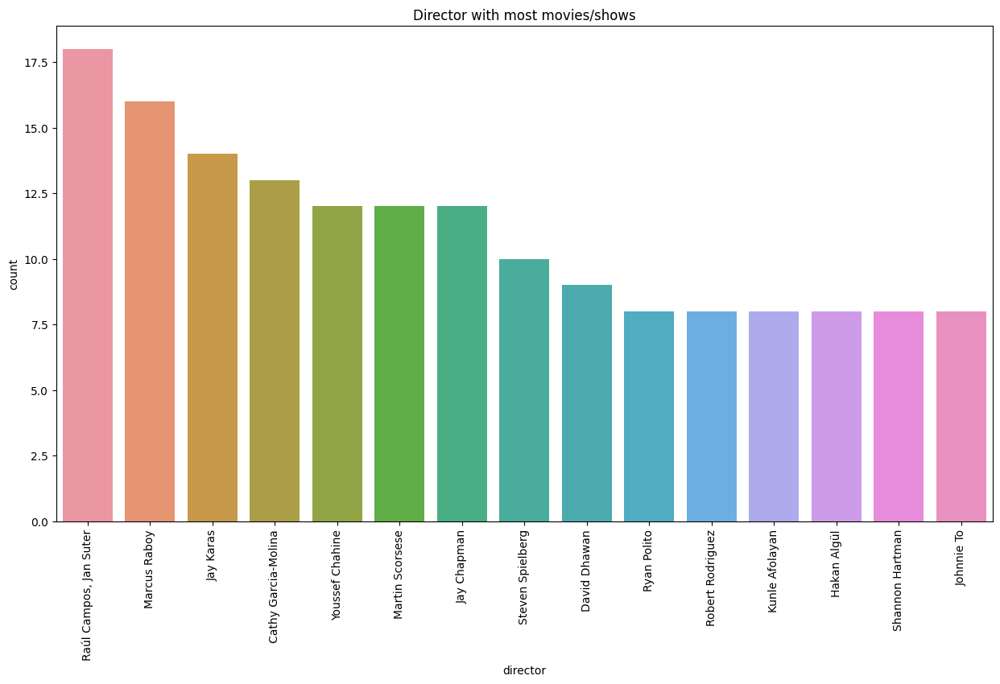

In [ ]:
#plot for director
plt.figure(figsize = (15,8))
sns.countplot(x='director',data=df,order=df.director.value_counts().head(15).index)
plt.title('Director with most movies/shows')
plt.xticks(rotation = 90)
plt.show()

**Inference**:Raul Campos,Jan Suter combinely best director who directs most movies in netflix followed by Marcus Roby,Jay Karas,Cathy garcia-Molina and many more

In [ ]:
#since there are many crows with nan director, we have filled it using empty string
df['director']=df['director'].fillna('')

# 4. Cast coloum

In [ ]:
#unique number of cast
df.cast.nunique()

6831

In [ ]:
#missing dealth with emprty string replacing
df_actors = df['cast'].fillna('')

In [ ]:
df_actors.isnull().sum()

0

In [ ]:
df_actors

0       João Miguel, Bianca Comparato, Michel Gomes, R...
1       Demián Bichir, Héctor Bonilla, Oscar Serrano, ...
2       Tedd Chan, Stella Chung, Henley Hii, Lawrence ...
3       Elijah Wood, John C. Reilly, Jennifer Connelly...
4       Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...
                              ...                        
7782    Imad Creidi, Antoinette Turk, Elias Gergi, Car...
7783    Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...
7784                                              Nasty C
7785                           Adriano Zumbo, Rachel Khoo
7786                                                     
Name: cast, Length: 7787, dtype: object

**Top 15 actors on netflix**

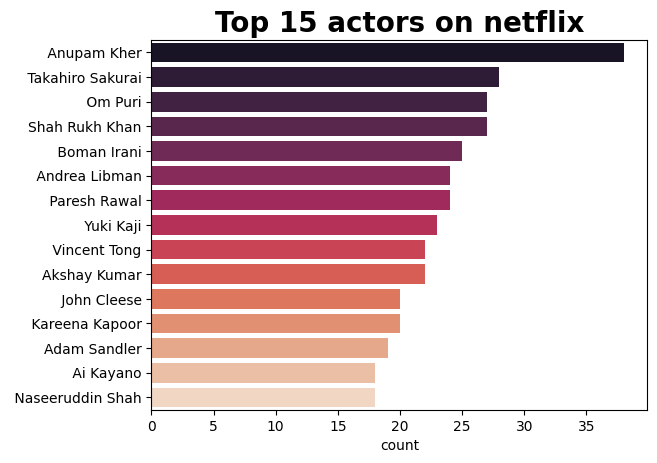

In [ ]:
actor = df[df.cast != ''].set_index('title').cast.str.split(',', expand=True).stack().reset_index(level=1, drop=True)

sns.countplot(y = actor, order=actor.value_counts().index[:15], palette = 'rocket')
plt.title('Top 15 actors on netflix',fontsize=20,fontweight='bold')
plt.show()

In [ ]:
#replacing cast with also empty string
df['cast']=df['cast'].fillna('')

**Inference**:

> Anupam Kher is the most popular actor in netflix followed by sharukh Khan, Om Puri, Akshay Kumar etc.



# 5. Country coloum

In [ ]:
# count of unique coloums
df.country.nunique()

681

In [ ]:
# Looking for countries and number of netflix productions
country_list=[]
tv_show=[]
movies=[]
for i in range(0,len(df)):
  if type(df['country'][i])== str:
    split=df['country'][i].split(',')
    for k in split:
      country_list.append(k.strip())
      if df['type'][i]=='TV Show':
        tv_show.append(k.strip())
      if df['type'][i]== 'Movie':
        movies.append(k.strip())
production_country=list(set([(i,country_list.count(i),tv_show.count(i),movies.count(i)) for i in country_list]))

In [ ]:
country_df= pd.DataFrame(production_country,columns=['country','Productions','TV-Shows','Movies'])
country_df=country_df.sort_values('Productions',ascending=False)
country_df=country_df.reset_index()
country_df=country_df.drop('index',axis=1)

**Top 15 countries with more no of production**

Text(0.5, 1.0, ' Top 10 countries with the highest number of shows')

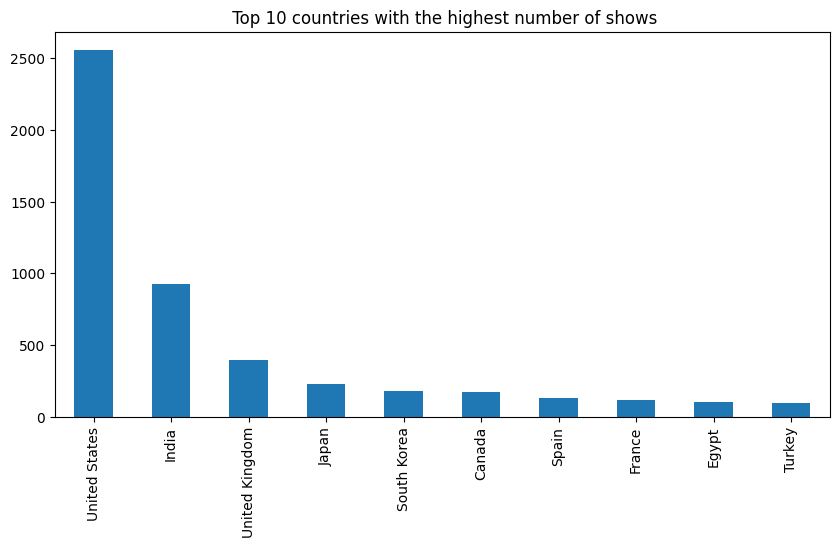

In [ ]:
# Top 10 countries with the highest number movies / TV shows in the dataset
plt.figure(figsize=(10,5))
df[~(df['country']=='Unknown')].country.value_counts().nlargest(10).plot(kind='bar')
plt.title(' Top 10 countries with the highest number of shows')

**Inference**:

> So,As you can see that

*   The United states stands out on top since Netflix is an American company.
*   India comes in second followed by the UK and Canada.





# 6. Date Added and release year

In [ ]:
#changed date added to datetime object
df["date_added"] = pd.to_datetime(df['date_added'])
df['year_added'] = df['date_added'].dt.year
df['month_added'] = df['date_added'].dt.month

In [ ]:
#year wise movie counts
df['year_added'].value_counts().reset_index().rename(columns= {'index':'year','year_added': 'movie_count'})

,year,movie_count
0,2019.0,2153
1,2020.0,2009
2,2018.0,1685
3,2017.0,1225
4,2016.0,443
5,2021.0,117
6,2015.0,88
7,2014.0,25
8,2011.0,13
9,2013.0,11


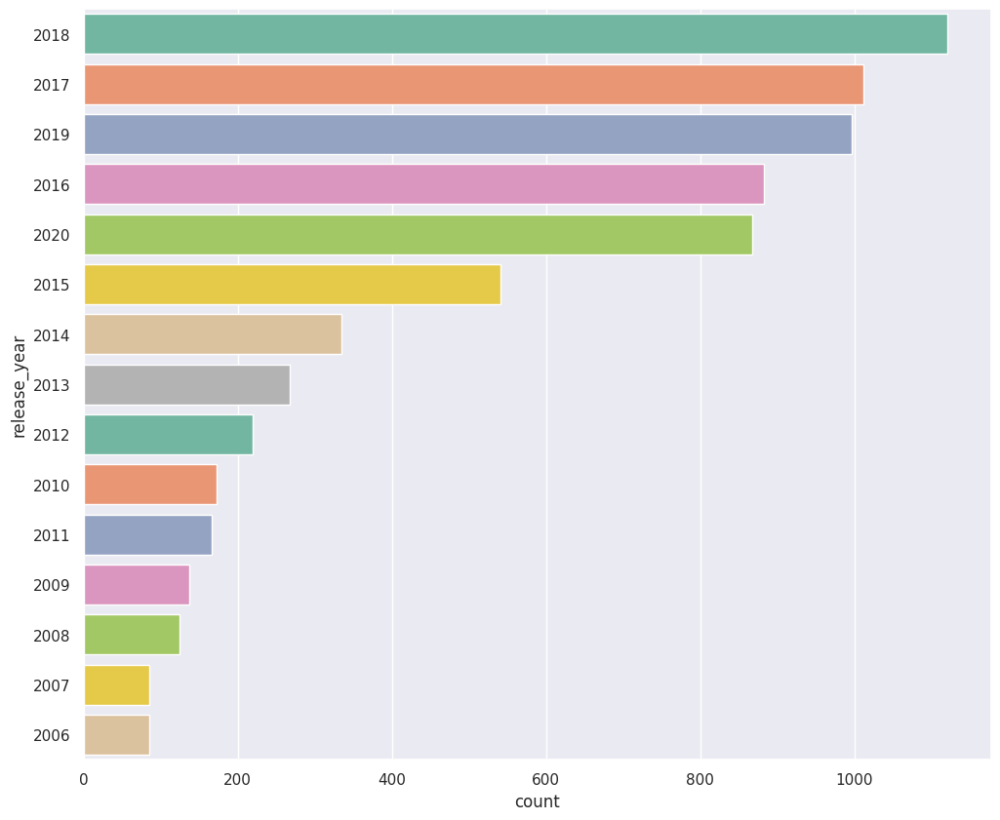

In [ ]:
plt.figure(figsize=(12,10))
sns.set(style="darkgrid")
ax = sns.countplot(y="release_year", data=df, palette="Set2", order=df['release_year'].value_counts().index[0:15])

In [ ]:
df.type.value_counts()

Movie      5377
TV Show    2410
Name: type, dtype: int64

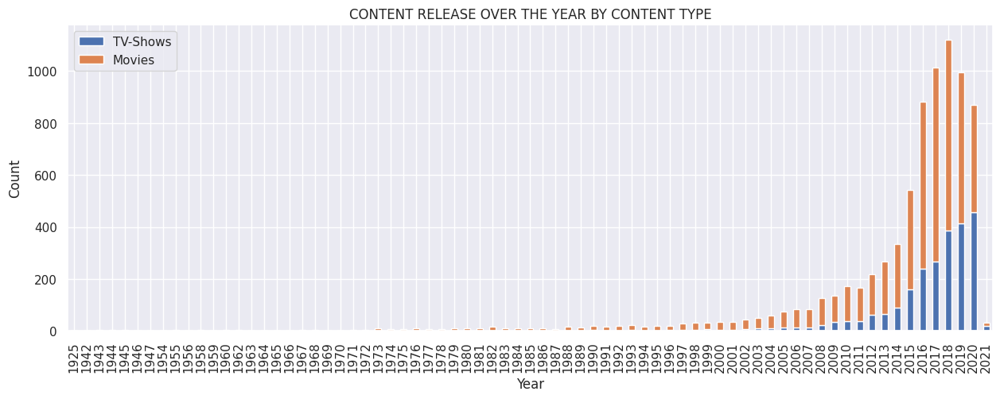

In [ ]:
# Calculate the number of releases by year and type
release_year = df.groupby(['release_year', 'type']).size().unstack(fill_value=0).reset_index()

# Rename the columns
release_year.columns = ['Year', 'Movies', 'TV-Shows']

# Plot the data
release_year.plot(x='Year', y=['TV-Shows', 'Movies'], kind='bar', stacked=True, figsize=(15, 5))

# Set the title and axis labels
plt.title('CONTENT RELEASE OVER THE YEAR BY CONTENT TYPE')
plt.xlabel('Year')
plt.ylabel('Count')

# Show the plot
plt.show()

**Inference**:

*   We can confirm that netflix report are true as we can see no of tv shows are above triple in 2018.
*   We can see that  total contents in netflix sharply increase after 2015 this may because of internet revolution in all over the world.

*   In 2020 movie counts are higher than tv shows.
*   Above this graph we can conclude that to expand the business opportunities netflix should focus more in netflix.





# 7. Rating coloum

<Axes: xlabel='rating', ylabel='count'>

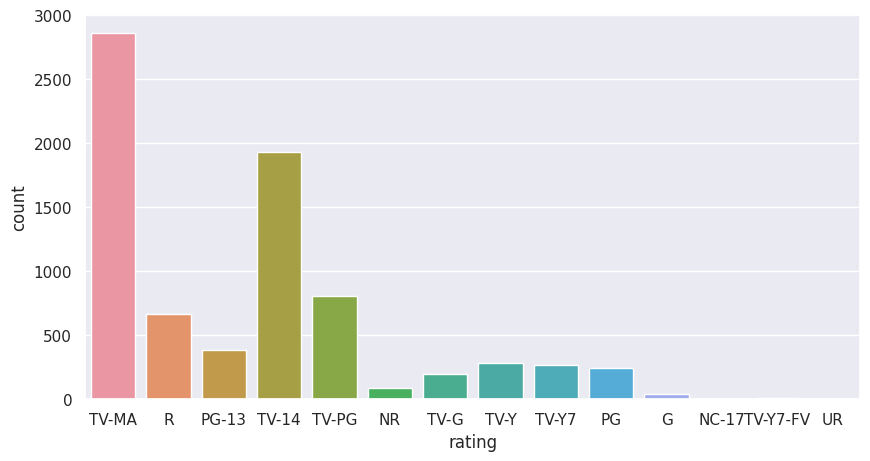

In [ ]:
# Age ratings for shows in the dataset
plt.figure(figsize=(10,5))
sns.countplot(x='rating',data=df)

 countplot() method is used to Show the counts of observations in each categorical bin using bars.

 In this plot we found all rating count. TV-MA is the highest rating and second
highest is TV-14 and third highest is TV-PG rating

**Rating distribution by content type**

Text(0.5, 1.0, 'Relation between  Type and Rating')

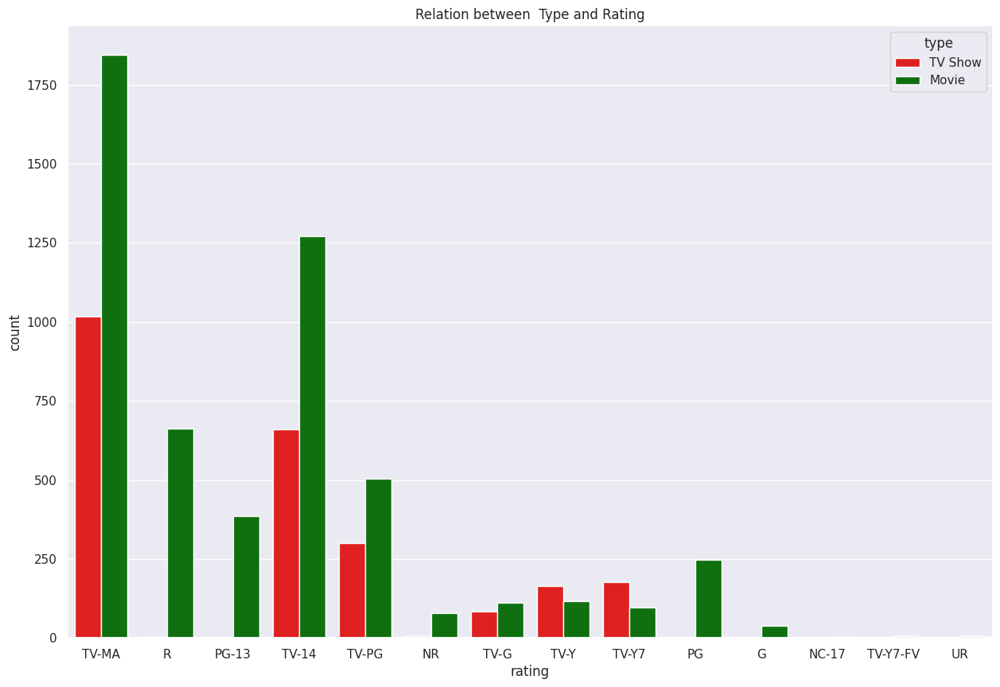

In [ ]:
# Graph for different rating on movies and tv shows
plt.figure(figsize=(15,10))
sns.countplot(x='rating', hue='type', data=df, palette={'TV Show': 'red', 'Movie': 'green'})
plt.title('Relation between  Type and Rating')

In [ ]:
# Changing the values in the rating column
rating_map = {'TV-MA':'Adults',
              'R':'Adults',
              'PG-13':'Teens',
              'TV-14':'Young Adults',
              'TV-PG':'Older Kids',
              'NR':'Adults',
              'TV-G':'Kids',
              'TV-Y':'Kids',
              'TV-Y7':'Older Kids',
              'PG':'Older Kids',
              'G':'Kids',
              'NC-17':'Adults',
              'TV-Y7-FV':'Older Kids',
              'UR':'Adults'}

df['rating'].replace(rating_map, inplace = True)



Text(0.5, 1.0, 'Number of shows on Netflix for different age groups')

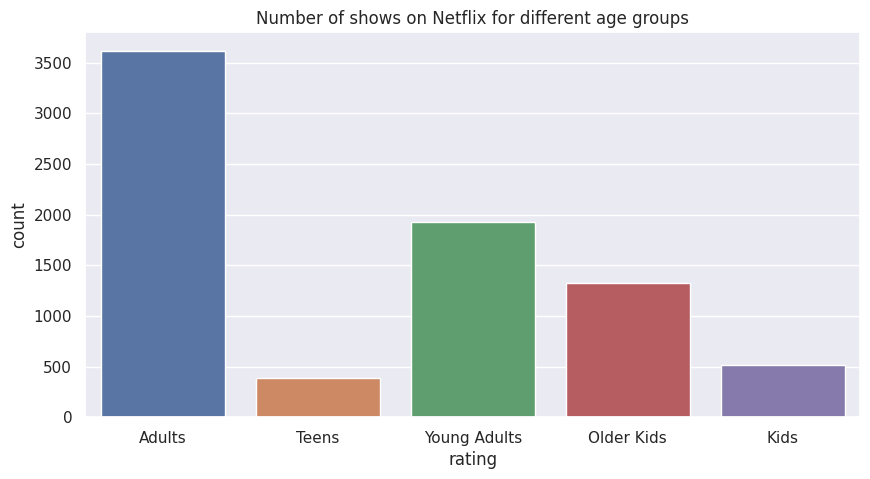

In [ ]:
# Age ratings for shows in the dataset
plt.figure(figsize=(10,5))
sns.countplot(x='rating',data=df)
plt.title('Number of shows on Netflix for different age groups')

**Inference**:

*   Most of the movies and tv-shows have rating of TV-MA(adults).
*   For the younger audiece(under the age of 17),it is the opposite, there are slightly more TV-shows than there are movies.



# 8.Duration column

In [ ]:
df.duration.unique()

array(['4 Seasons', '93 min', '78 min', '80 min', '123 min', '1 Season',
       '95 min', '119 min', '118 min', '143 min', '103 min', '89 min',
       '91 min', '149 min', '144 min', '124 min', '87 min', '110 min',
       '128 min', '117 min', '100 min', '2 Seasons', '84 min', '99 min',
       '90 min', '102 min', '104 min', '105 min', '56 min', '125 min',
       '81 min', '97 min', '106 min', '107 min', '109 min', '44 min',
       '75 min', '101 min', '3 Seasons', '37 min', '113 min', '114 min',
       '130 min', '94 min', '140 min', '135 min', '82 min', '70 min',
       '121 min', '92 min', '164 min', '53 min', '83 min', '116 min',
       '86 min', '120 min', '96 min', '126 min', '129 min', '77 min',
       '137 min', '148 min', '28 min', '122 min', '176 min', '85 min',
       '22 min', '68 min', '111 min', '29 min', '142 min', '168 min',
       '21 min', '59 min', '20 min', '98 min', '108 min', '76 min',
       '26 min', '156 min', '30 min', '57 min', '150 min', '133 min',
       '1

In [ ]:
#subsetting TV Show and Movie for duration
netflix_shows=df[df['type']=='TV Show']
netflix_movies=df[df['type']=='Movie']


**Netflix Movie Duration Distribution**

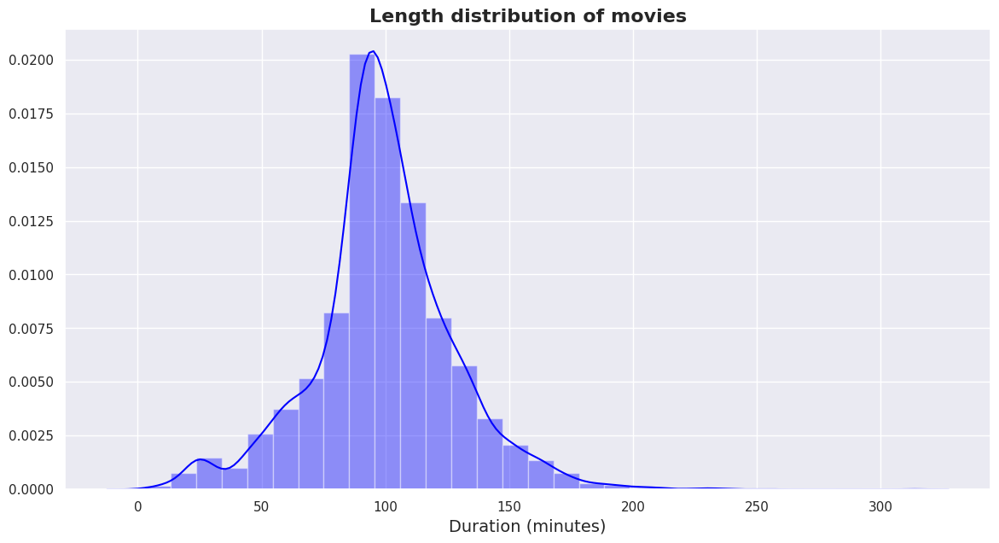

In [ ]:
import pandas as pd

# Extract the numerical part of the duration strings
duration = netflix_movies['duration'].str.extract('(\d+)').astype(int)

# Plot the distribution of movie durations
plt.figure(figsize=(14, 7))
sns.distplot(duration, bins=30, color='Blue').set(ylabel=None)
plt.title('Length distribution of movies', fontsize=16, fontweight="bold")
plt.xlabel('Duration (minutes)', fontsize=14)
plt.show()


**Inference**: Most content are about 70 to 120 min duration for movies

**Analyze duration of TV-shows**

In [ ]:
# Extract the numerical part of the duration strings
duration = netflix_shows['duration'].str.extract('(\d+)').astype(int)






<Axes: title={'center': 'Distribution of TV Shows duration'}, xlabel='duration', ylabel='count'>

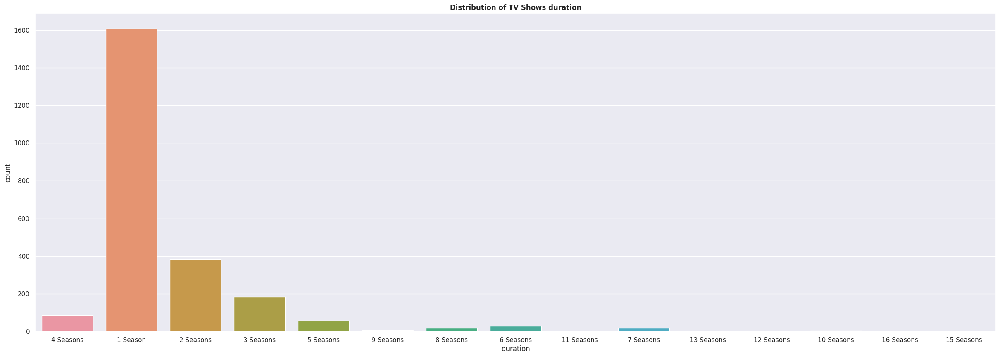

In [ ]:
#Checking the distribution of TV SHOWS
plt.figure(figsize=(30,10))
plt.title("Distribution of TV Shows duration",fontweight='bold')
sns.set(style="darkgrid")
sns.countplot(x='duration', data=netflix_shows)

**Inference**:

*   Most of the TV-shows are 1 to 2 seasons long.
*   Very few shows are stretch upto 5 to 9.



# 9. Genre

In [ ]:
df.listed_in.unique()

array(['International TV Shows, TV Dramas, TV Sci-Fi & Fantasy',
       'Dramas, International Movies',
       'Horror Movies, International Movies',
       'Action & Adventure, Independent Movies, Sci-Fi & Fantasy',
       'Dramas', 'International TV Shows, TV Dramas, TV Mysteries',
       'Horror Movies, International Movies, Thrillers',
       'Dramas, Thrillers',
       'Crime TV Shows, International TV Shows, TV Dramas',
       'Crime TV Shows, Docuseries, International TV Shows',
       'Documentaries, International Movies, Sports Movies',
       'Independent Movies, Sci-Fi & Fantasy, Thrillers',
       'Dramas, International Movies, Thrillers',
       'International TV Shows, TV Dramas',
       'Comedies, Dramas, Independent Movies', 'Sports Movies',
       'Dramas, Independent Movies, International Movies',
       'Action & Adventure, Dramas, International Movies',
       'Anime Series, International TV Shows', 'Documentaries',
       'Reality TV', 'Documentaries, International

In [ ]:
#genre to list
def convert_to_list(df):
  genre_count = {}
  genre_count_final = []
  genre_list = list(df['listed_in'])
  for each in range(len(genre_list)):
    genre_count_final.extend(genre_list[each].split(", "))
  for each in genre_count_final:
    if each not in genre_count:
      genre_count[each] = genre_count_final.count(each)
  return genre_count

In [ ]:
#to list
genre_dict = convert_to_list(df)

In [ ]:
#make genre df
genre_df = pd.DataFrame.from_dict(genre_dict, orient='index', columns=['count']).sort_values('count', ascending=False)

In [ ]:
#genre distribution
genre_df

,count
International Movies,2437
Dramas,2106
Comedies,1471
International TV Shows,1199
Documentaries,786
Action & Adventure,721
TV Dramas,704
Independent Movies,673
Children & Family Movies,532
Romantic Movies,531


In [ ]:
len(genre_df)

42

**top genres on netflix**

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41]),
 [Text(0, 0, 'International Movies'),
  Text(1, 0, 'Dramas'),
  Text(2, 0, 'Comedies'),
  Text(3, 0, 'International TV Shows'),
  Text(4, 0, 'Documentaries'),
  Text(5, 0, 'Action & Adventure'),
  Text(6, 0, 'TV Dramas'),
  Text(7, 0, 'Independent Movies'),
  Text(8, 0, 'Children & Family Movies'),
  Text(9, 0, 'Romantic Movies'),
  Text(10, 0, 'TV Comedies'),
  Text(11, 0, 'Thrillers'),
  Text(12, 0, 'Crime TV Shows'),
  Text(13, 0, "Kids' TV"),
  Text(14, 0, 'Docuseries'),
  Text(15, 0, 'Romantic TV Shows'),
  Text(16, 0, 'Stand-Up Comedy'),
  Text(17, 0, 'Music & Musicals'),
  Text(18, 0, 'Horror Movies'),
  Text(19, 0, 'British TV Shows'),
  Text(20, 0, 'Reality TV'),
  Text(21, 0, 'Sci-Fi & Fantasy'),
  Text(22, 0, 'Sports Movies'),
  Text(23, 0, 'Korean TV Shows'),
  Text(24, 0, 'TV Action

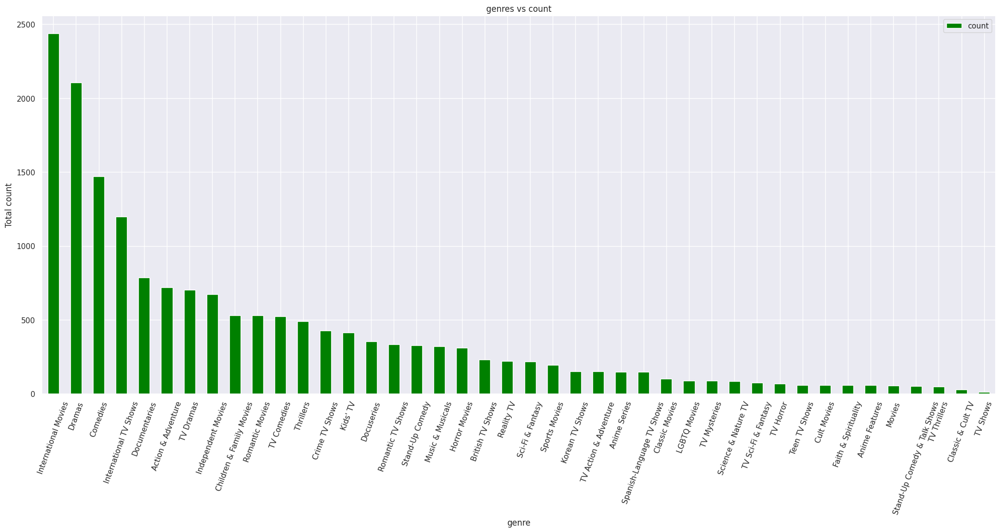

In [ ]:
plt.rcParams["figure.figsize"] = (25, 10)
genre_df.plot(kind='bar', color='green')
plt.xlabel("genre")
plt.ylabel("Total count")
plt.title("genres vs count")
plt.xticks(rotation=70)

**Inference**:

*   We can see that international movies,Dramas,comedies, documentaries, international tv shows are most popular genres on netflix.
*   classic and cult shows these are very less popular genres.



# 10. Description

In [ ]:
#word cloud for user rating review
def func_select_Category(category_name,category_column,column_of_choice):
  df_word_cloud = df[[category_column,column_of_choice]].dropna()
  df_word_cloud = df_word_cloud[df_word_cloud[category_column]==category_name]
  text = " ".join(word for word in df_word_cloud[column_of_choice])
  # Create stopword list:
  stopwords = set(STOPWORDS)
  # Generate a word cloud image
  wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)
  # Display the generated image:
  # the matplotlib way:
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

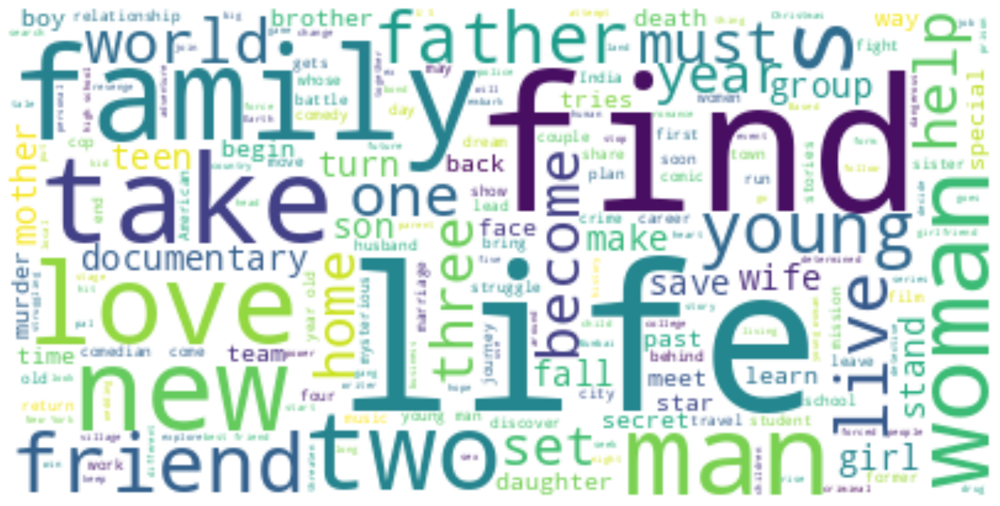

In [ ]:
#Word Cloud for Movie on Description Column
func_select_Category('Movie','type','description')

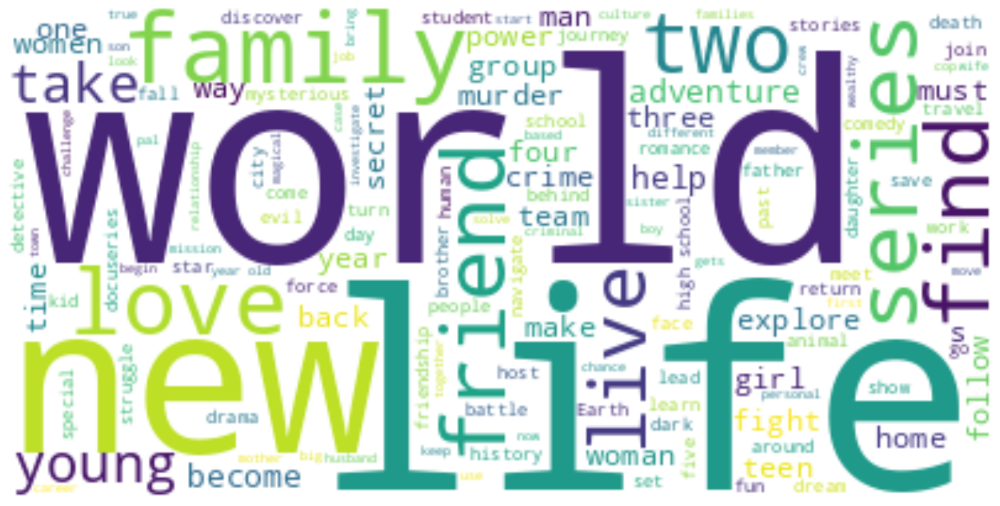

In [ ]:
#Word Cloud for TV-Shows on Description Column
func_select_Category('TV Show','type','description')

**Inference**:

*   We can see that life,family, friend, new, love these words are most popping up before movies and TV-shows.




# **Bi-variate and Trend Analysis**



#Country wise Trend Analysis



In [ ]:
#genre country wise
def get_genre_country_trends(df):
  def explode_country(country):
    try:
        return country.split(", ")
    except:
        return ""
  df['country_list'] = df.apply(lambda x: explode_country(x['country']),axis=1)
  df = df.explode('country_list')
  df['genre_list'] = df.apply(lambda x: explode_country(x['listed_in']),axis=1)
  df = df.explode('genre_list')
  df.groupby(['country_list','genre_list']).agg({'title':'count'})
  grouped_df_ = df.groupby(['country_list','genre_list']).agg({'title':'count'})
  grouped_df = grouped_df_.reset_index()
  grouped_df['country_list'].values
  grouped_df = grouped_df[grouped_df.country_list != '']
  rating_country_df = grouped_df.reset_index().drop("index", axis=1)
  list_of_countries = list(set(list(rating_country_df['country_list'].values)))
  for each in list_of_countries:
    rating_country_df[rating_country_df['country_list'] == each].sort_values("title",ascending=False).plot.bar(x = "genre_list", y="title", color="skyblue", rot=90, figsize=(9,5))
    plt.title(f"{each}")
  return rating_country_df

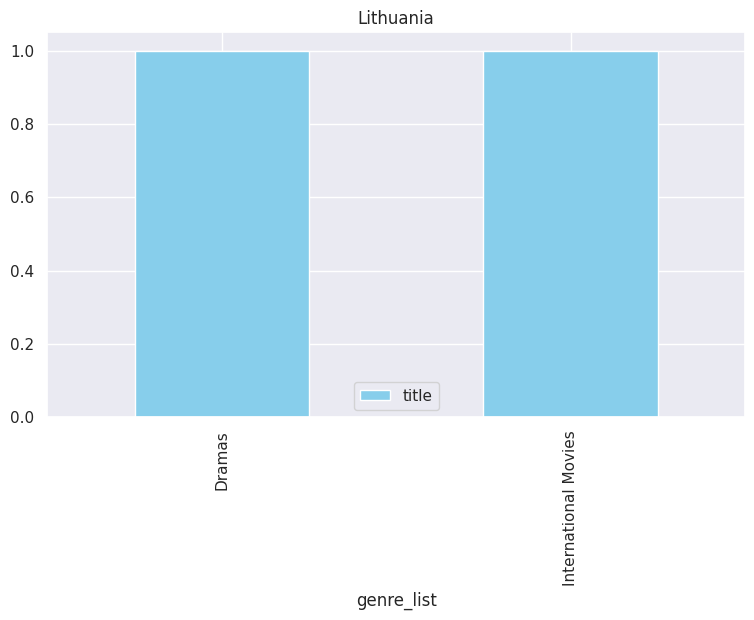

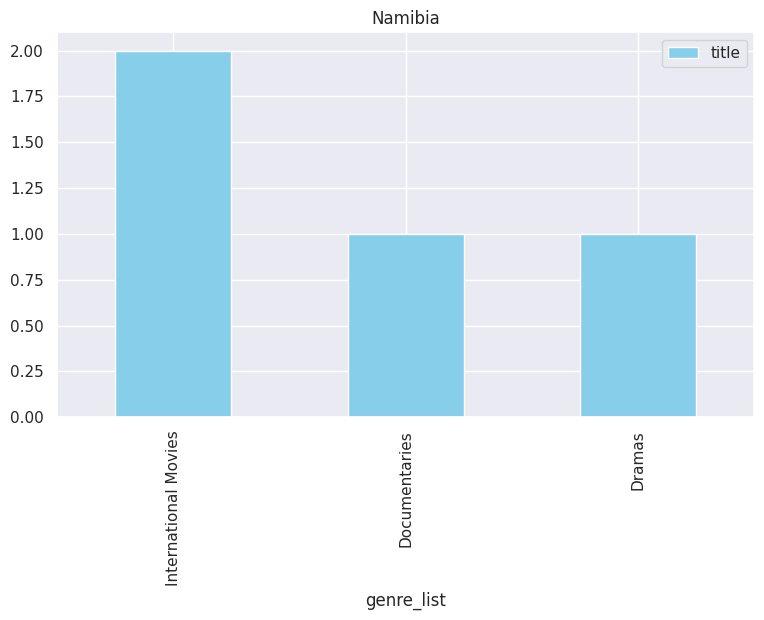

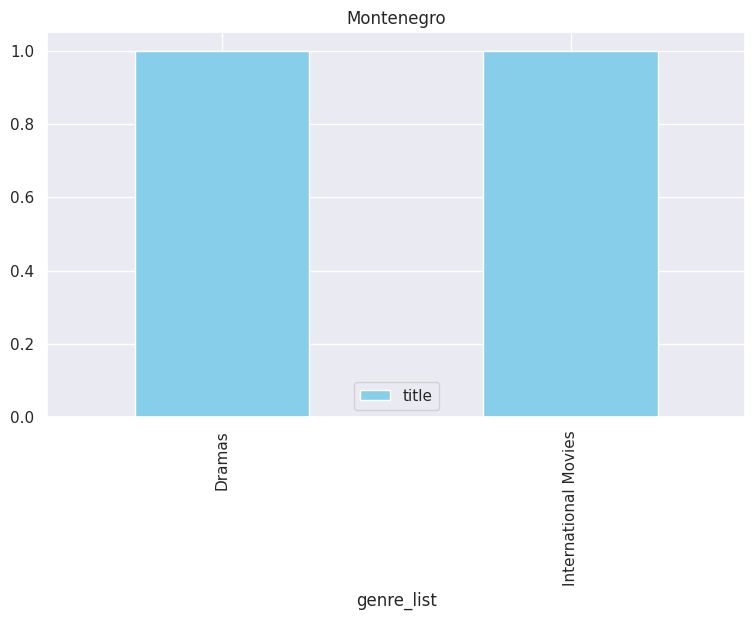

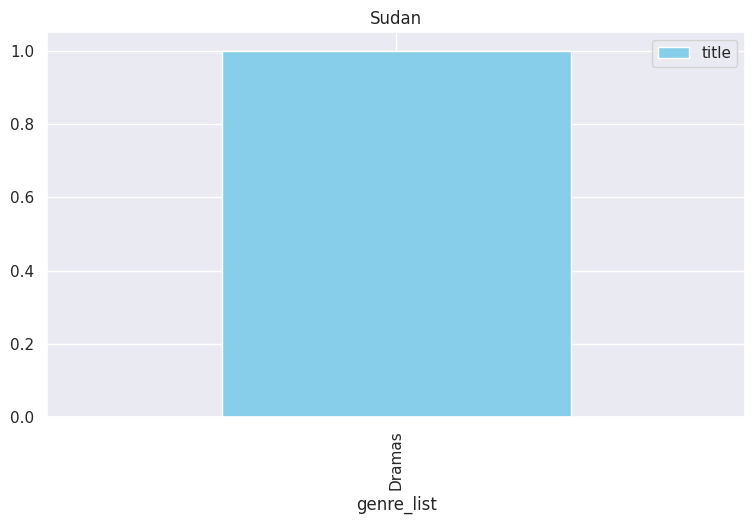

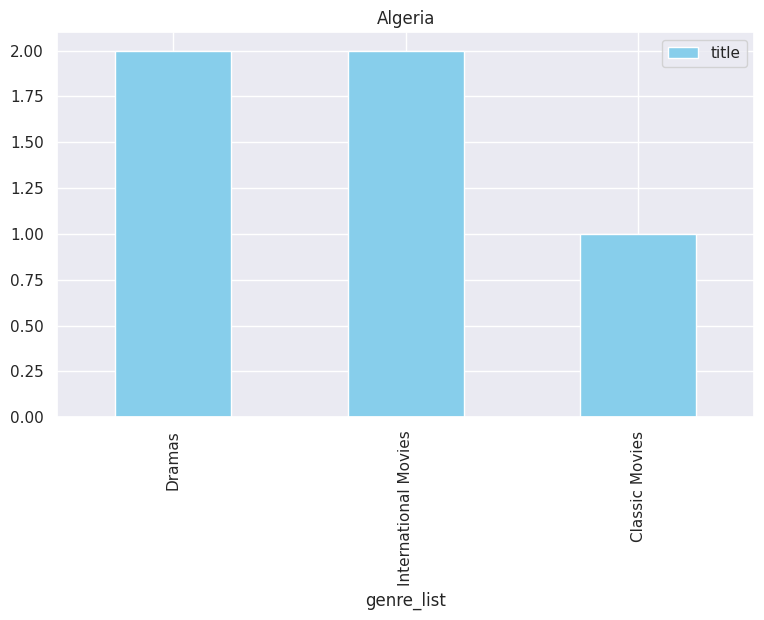

...

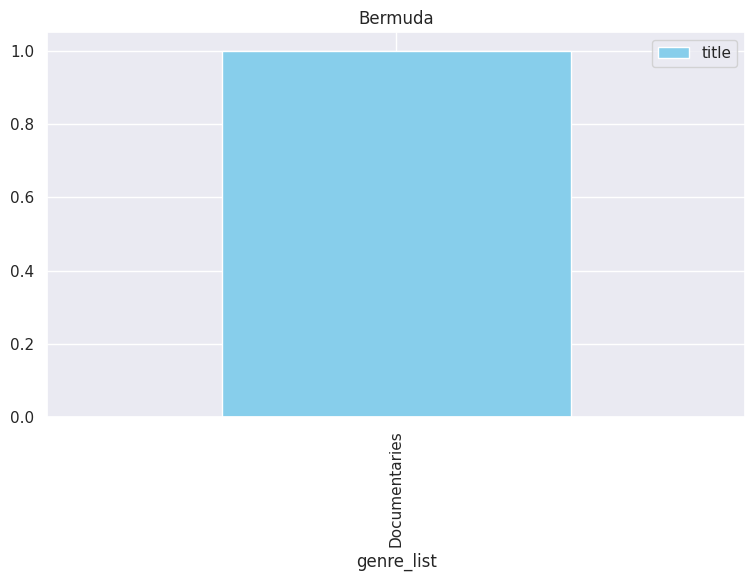

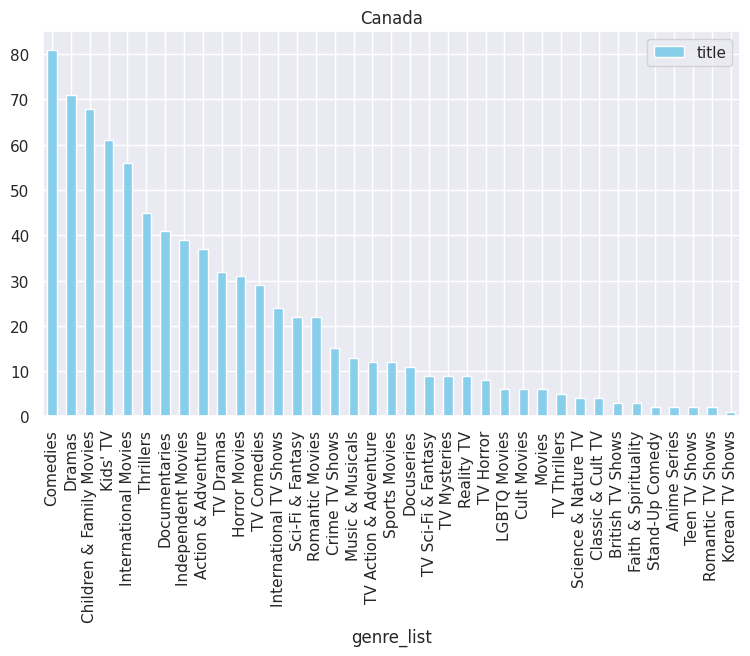

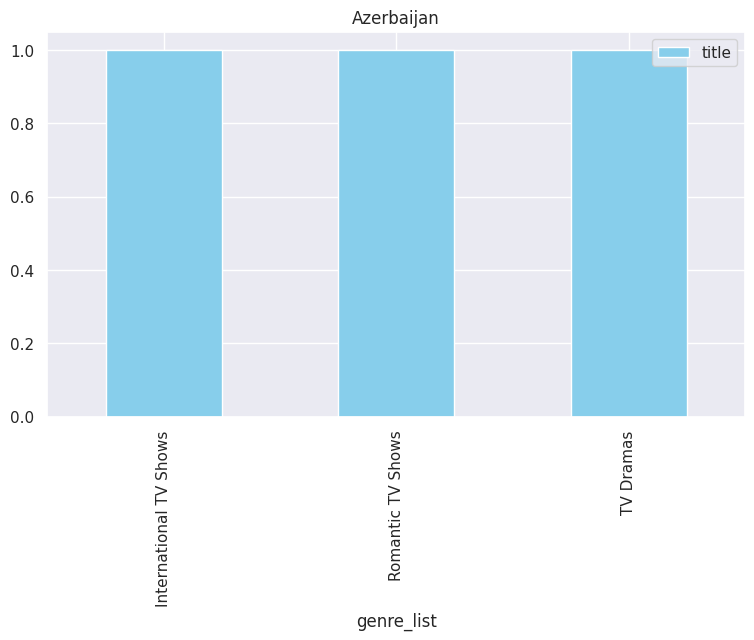

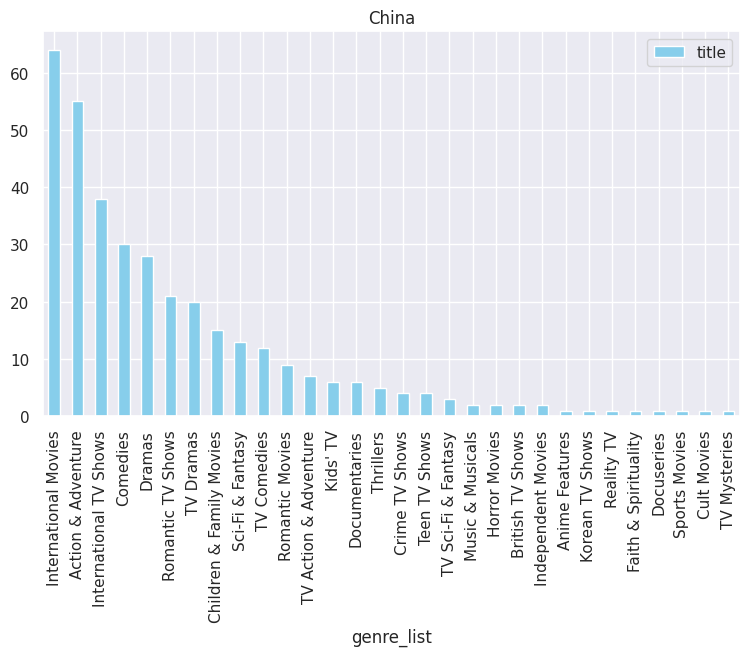

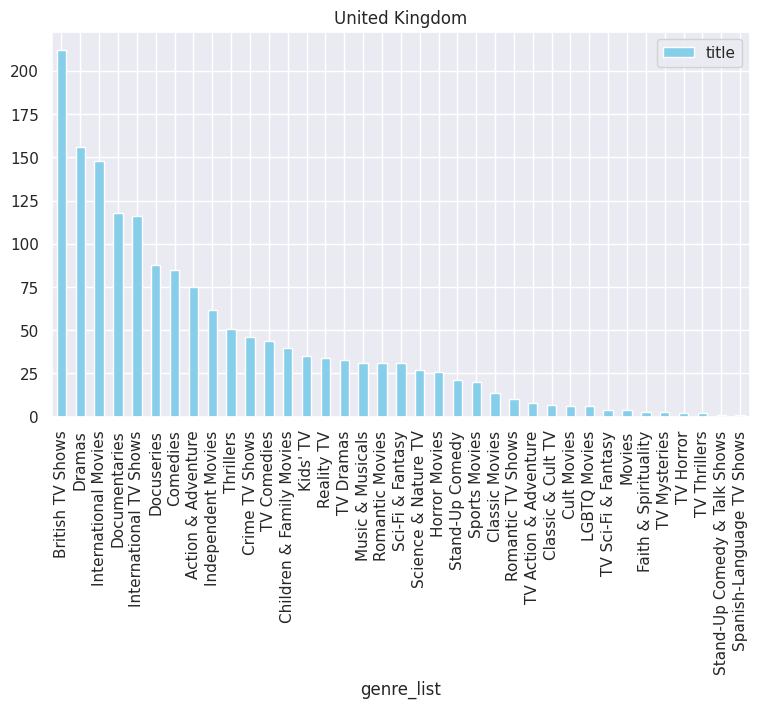

In [ ]:
rating_country_df = get_genre_country_trends(df)
plt.show()

**Word Cloud for countries like US, India, UK, France, Canada etc**

In [ ]:
def get_word_clouds(rating_country_df):
  country_list_ = ["United States", "India", "United Kingdom", "France", "China"]
  #using wordcloud to identify most used words
  from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
  for each in country_list_:
    plt.rcParams['figure.figsize'] = (10, 10)
    wordcloud = WordCloud(stopwords=STOPWORDS,background_color = 'white', width = 1000,  height = 500, max_words = 121).generate(' '.join(rating_country_df[rating_country_df["country_list"]==each]['genre_list']))
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.title(f'Most popular genres for {each}',fontsize = 30)
    plt.show()



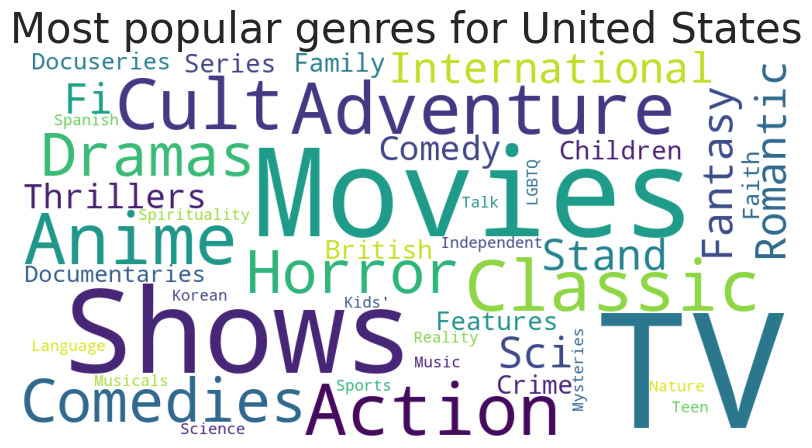

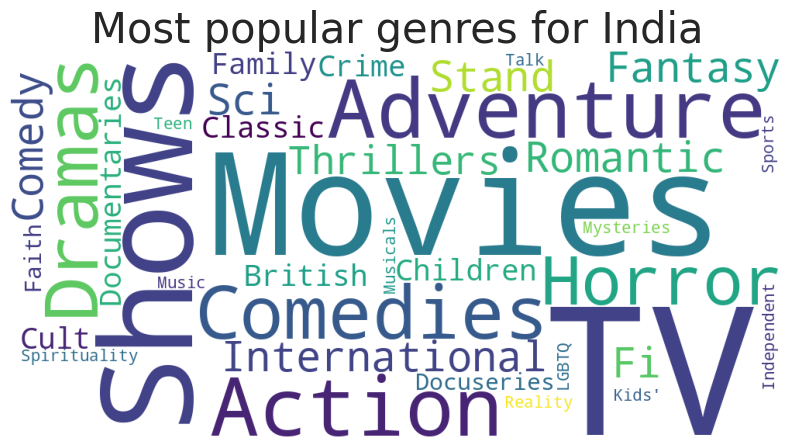

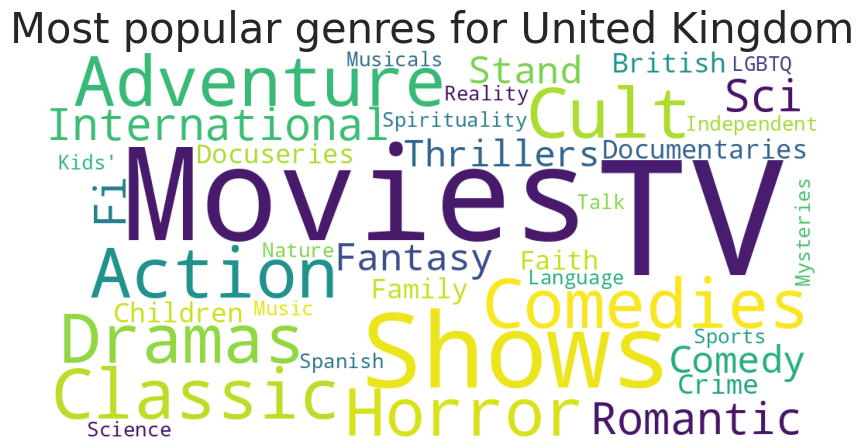

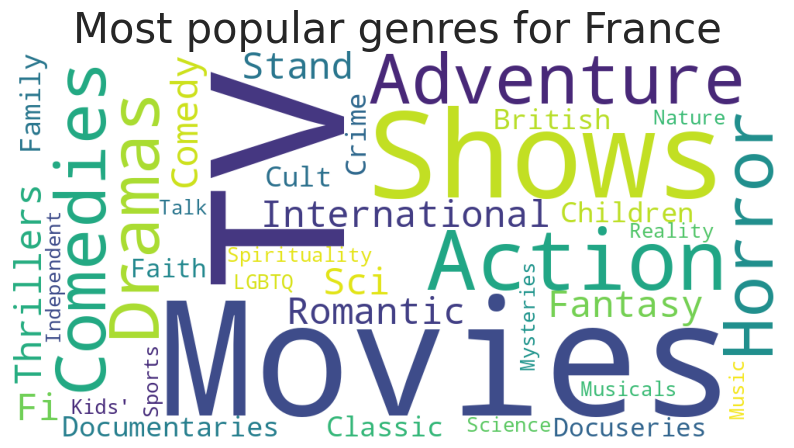

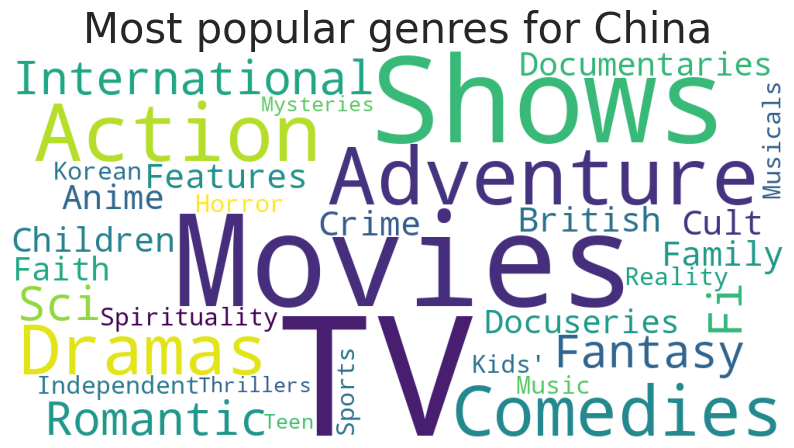

In [ ]:
get_word_clouds(rating_country_df)

**Inference**:

1.International Movies,Comedies,Dramas etc are most popular genres in most of the countries including US,India,France etc.

2.It defines that people expected more internation movies, shows than regional shows in netflix.

3.Interestingly US people prefers drama, comedies genres more as netflix is an us company so they do not prefer international movies much in netflix.

4.Indian people prefers international movies in netflix like most of other countries.

So from this we can conclude that netflix should focus more on their international movie and tv shows as people likes and consumes their content most often from all over the world. It will surely impacts their businesses positively.

**Country vs Type trend analysis**

In [ ]:
#getting country wise rating trend
def get_country_type_trends(df):
  def explode_country(country):
   #excecute split on the basis of ',' otherwise return ''
    try:
        return country.split(", ")
    except:
        return ""

   #create seperate country list
  df['country_list'] = df.apply(lambda x: explode_country(x['country']),axis=1)
  df = df.explode('country_list')

  #find country and their preferred type
  grouped_df_ = df.groupby(['country_list','type']).agg({'title':'count'})
  grouped_df = grouped_df_.reset_index()
  grouped_df['country_list'].values
  grouped_df = grouped_df[grouped_df.country_list != '']
  rating_country_df = grouped_df.reset_index().drop("index", axis=1)

  #visualize country vs genres trend with graph
  list_of_countries = list(set(list(rating_country_df['country_list'].values)))
  for c in list_of_countries:
    rating_country_df[rating_country_df['country_list'] == c].sort_values("title",ascending=False).plot.bar(x = "type", y="title", color="green", rot=45, figsize=(10,10))
    plt.title(f"{c}")

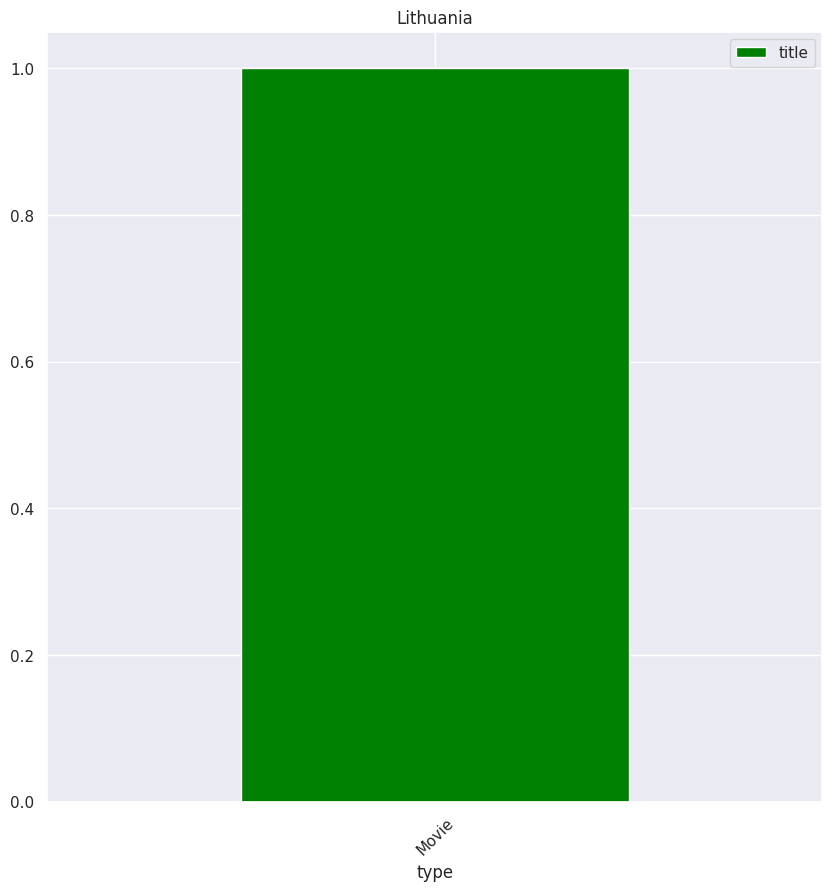

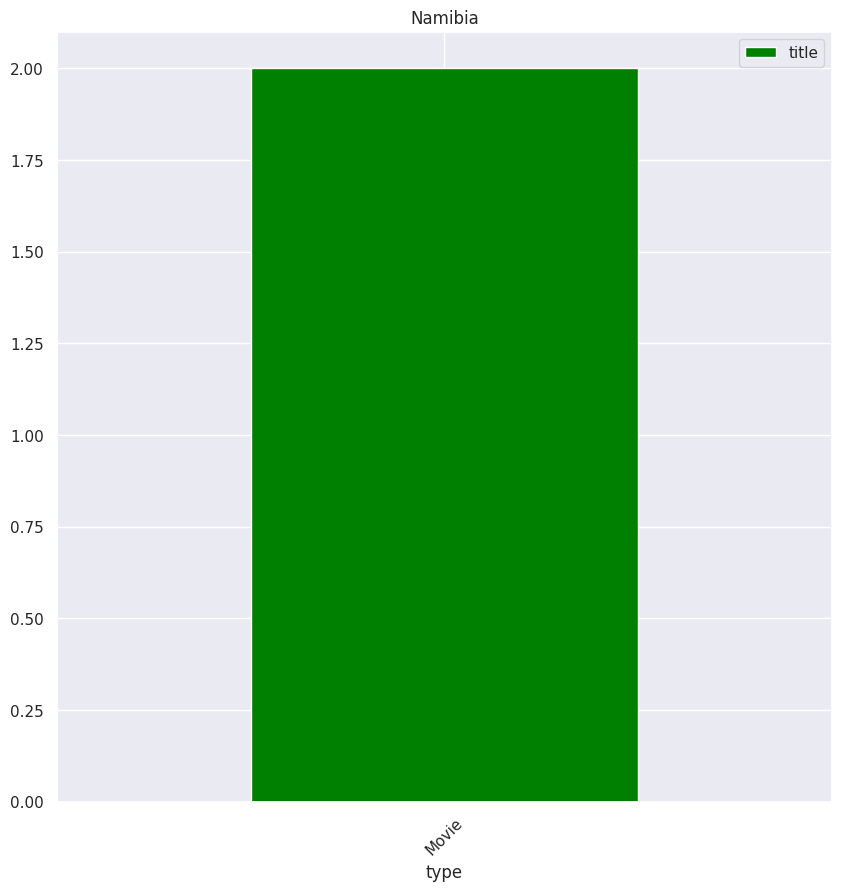

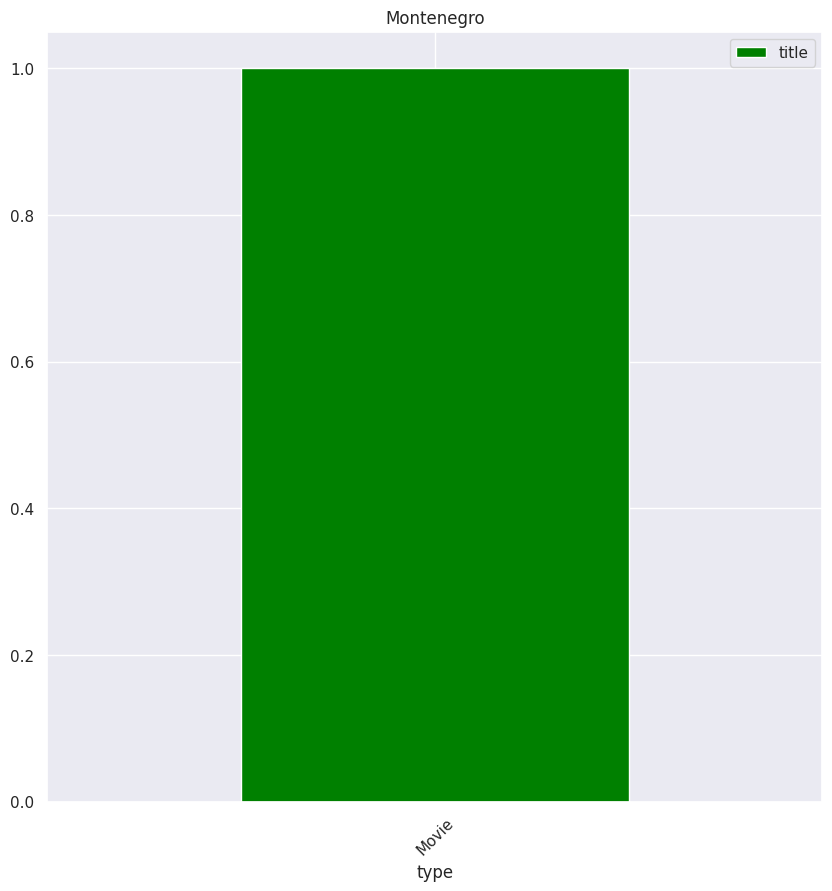

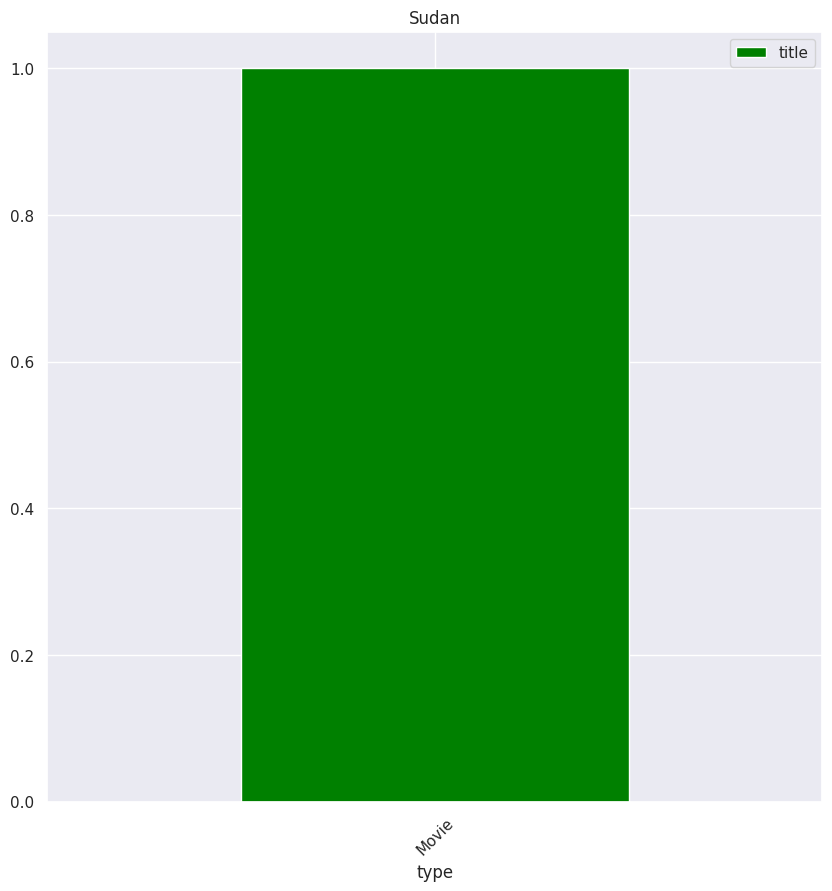

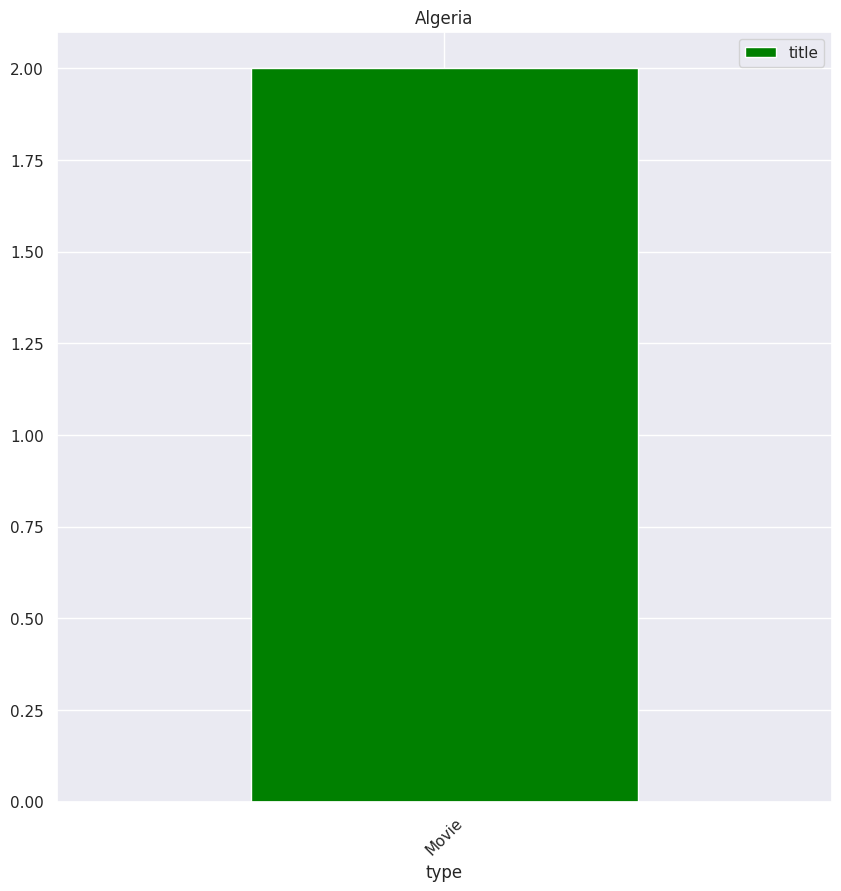

...

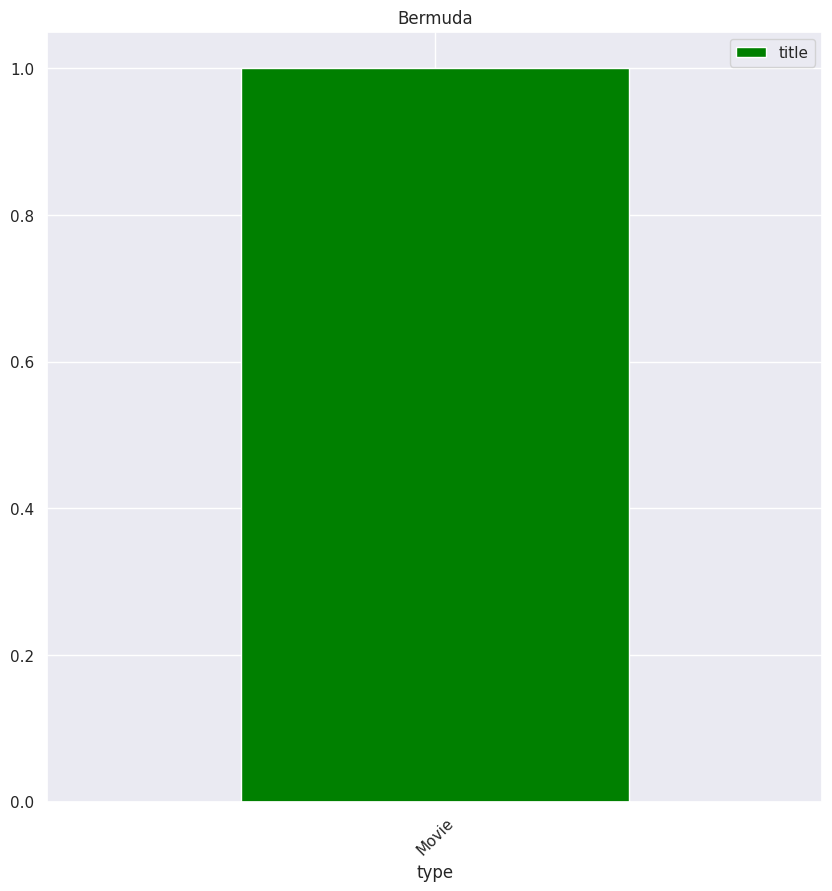

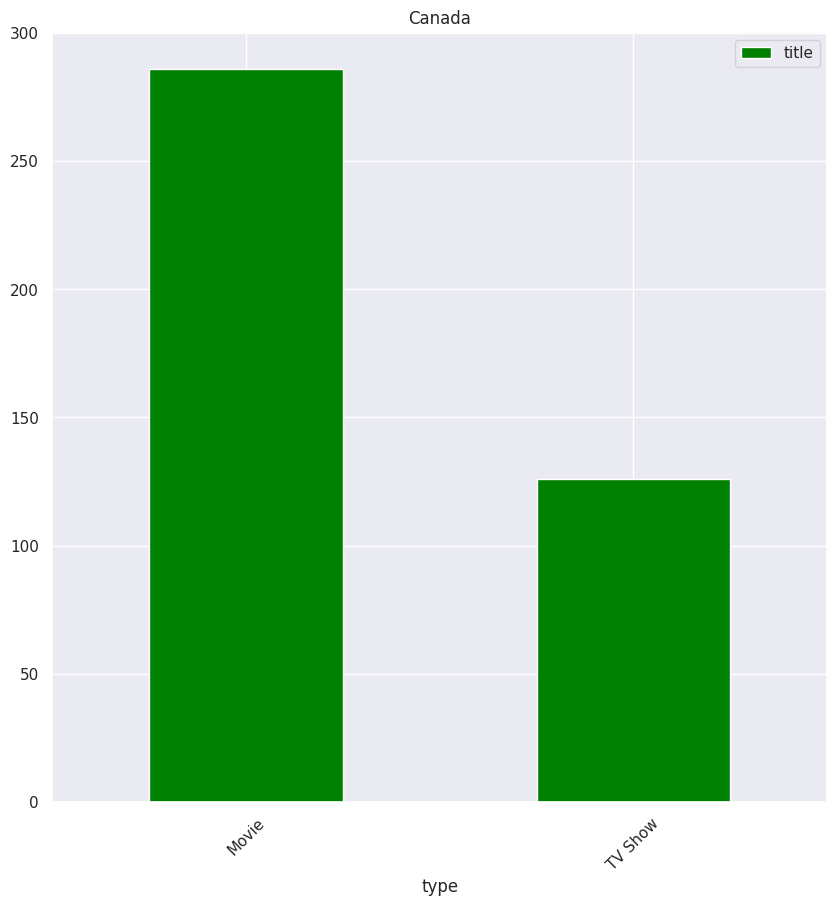

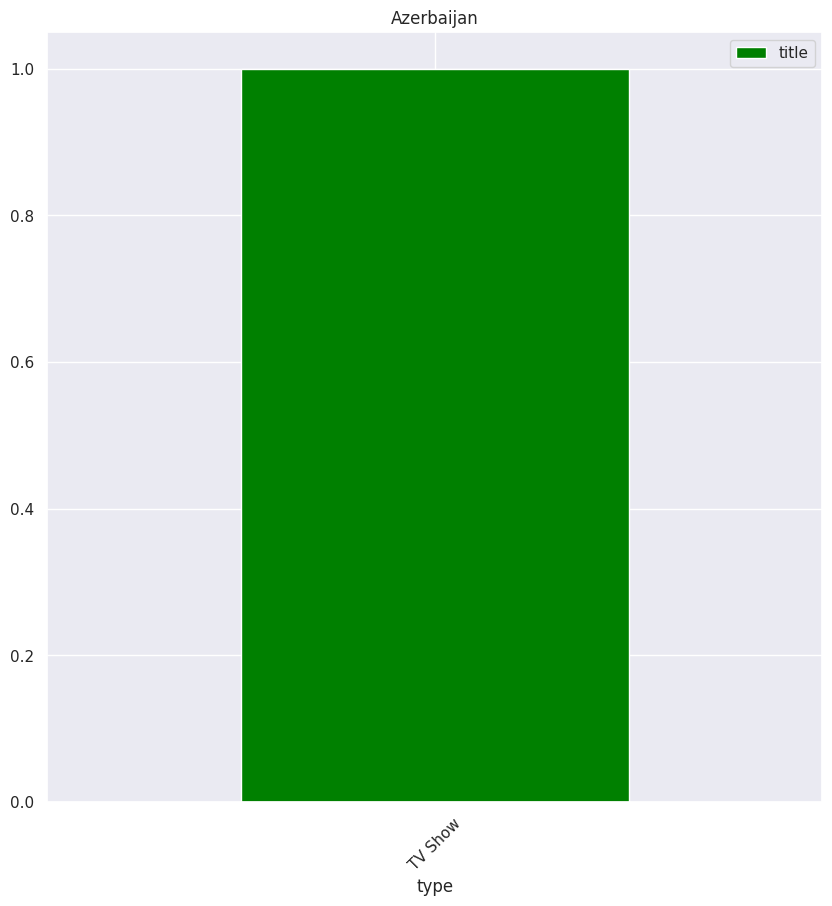

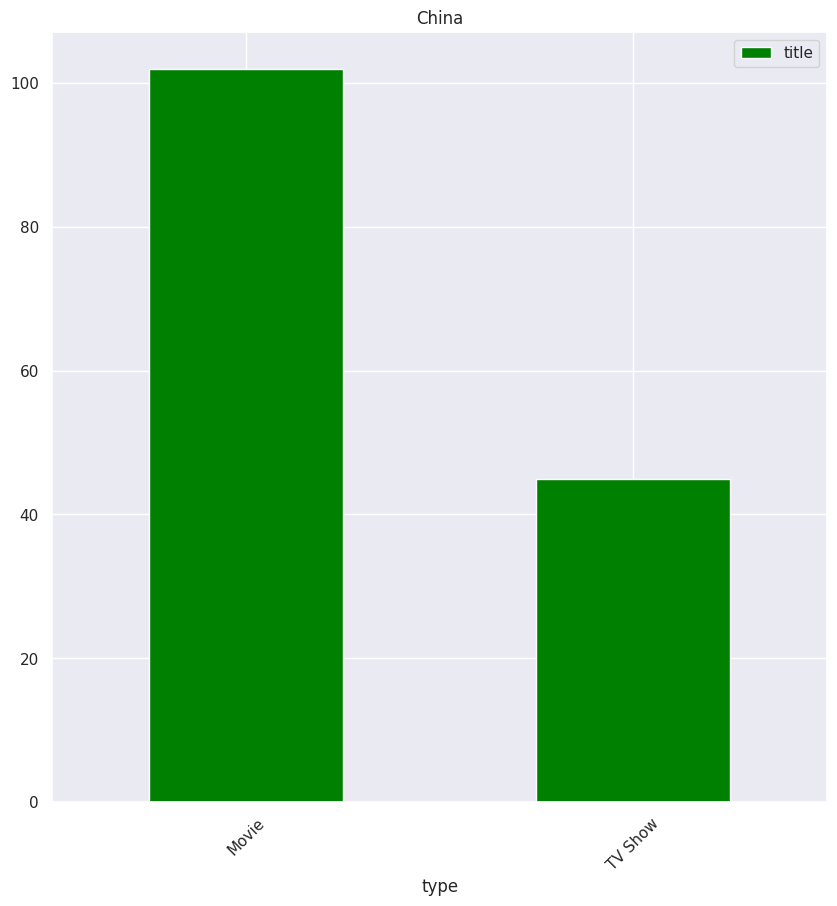

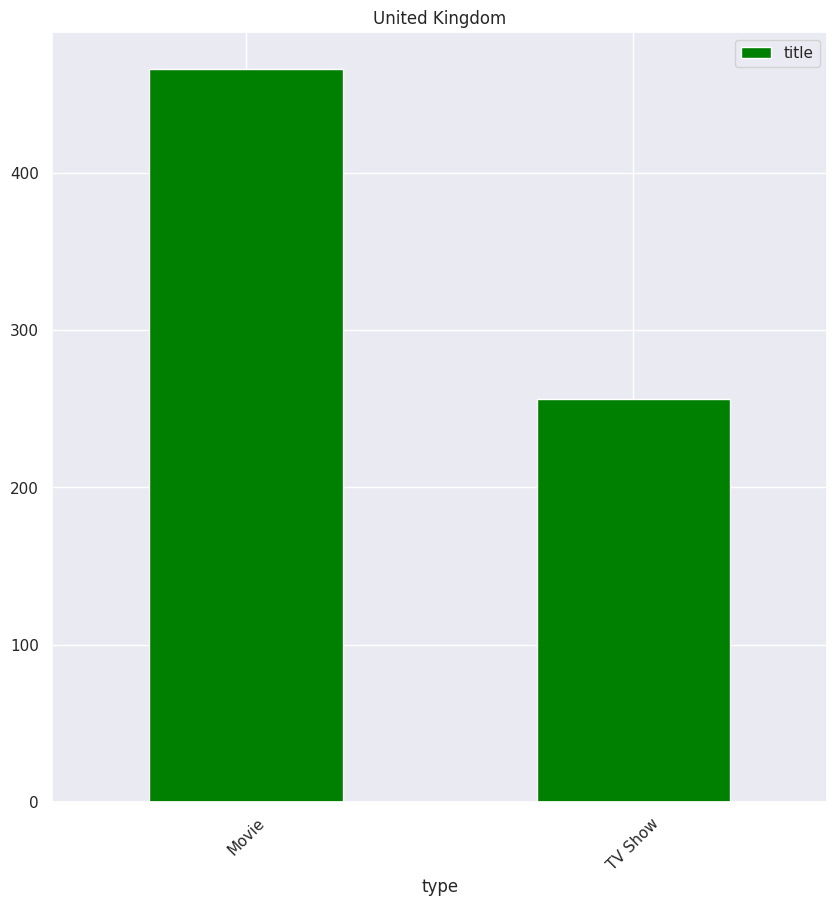

In [ ]:
get_country_type_trends(df)


**Inference**:

Generally countries preferred movies over tv shows in netflix maybe because it has more movie counts than tv shows.

It concludes that to expand their business more netflix should produce more tv shows and must increase the quality of movies as it is their most popular type.


**Word Clouds Specific for Countries**

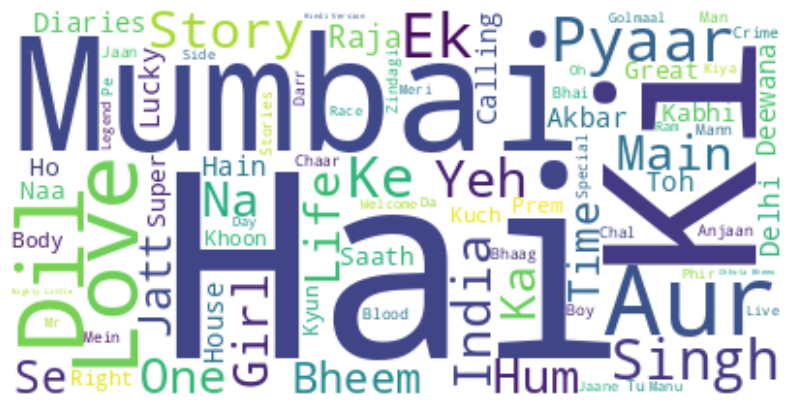

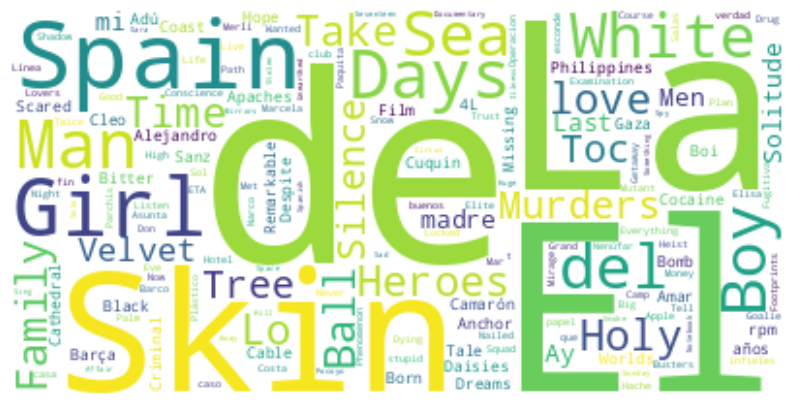

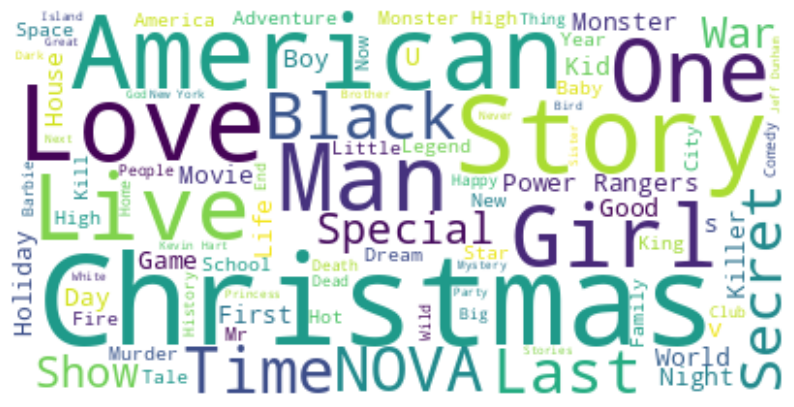

In [ ]:
#most use description for top country
for i in ['India','Spain','United States']:
  func_select_Category(i,'country','title')

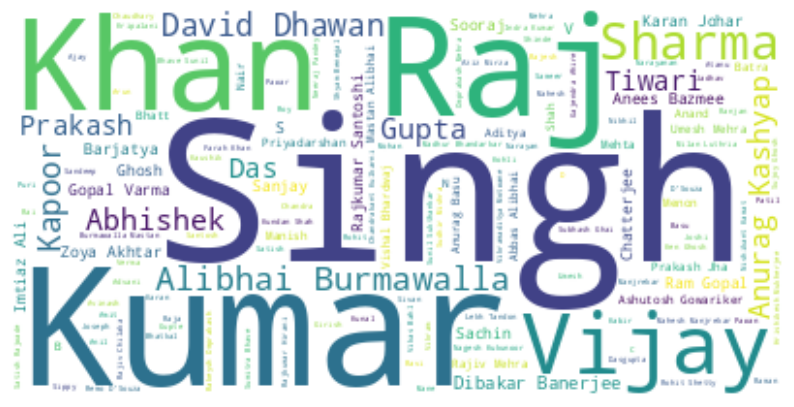

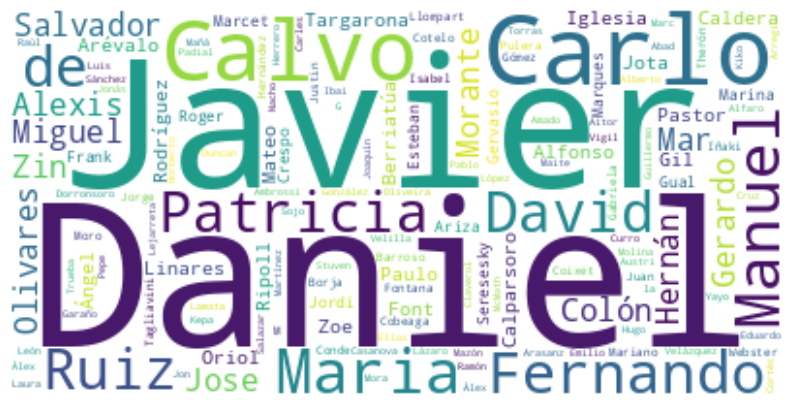

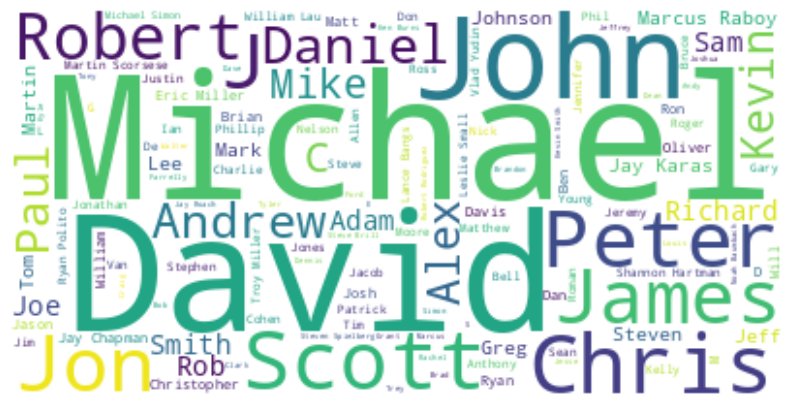

In [ ]:
#most popular directors in top countries
for i in ['India','Spain','United States']:
  func_select_Category(i,'country','director')

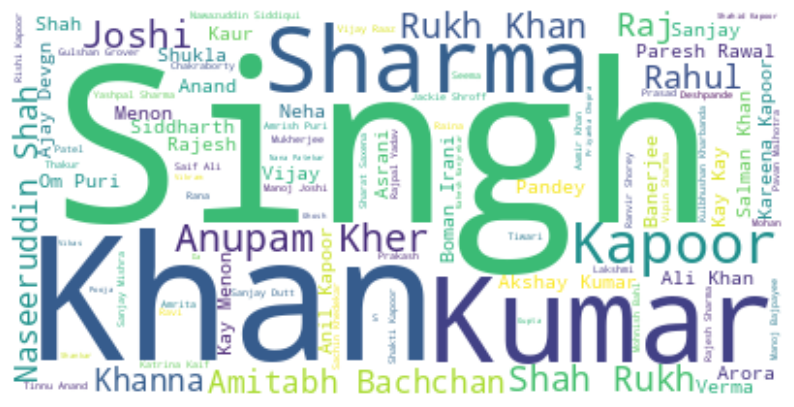

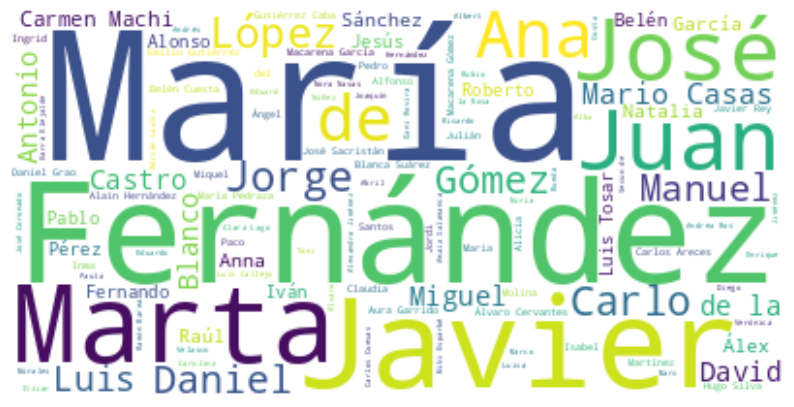

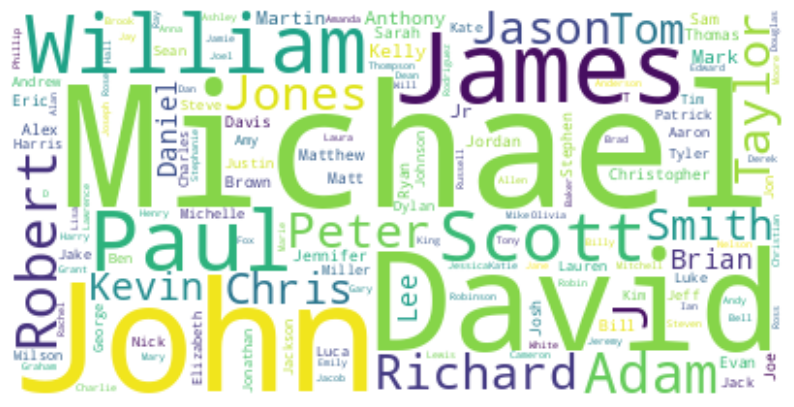

In [ ]:
# most hired Cast from different Countries
for i in ['India','Spain','United States']:
  func_select_Category(i,'country','cast')

**Inference**:

*    we can see that most use descriptions are mumbai, cristmas,american,love etc in india,US,spain.
*   Also we see there are more directors(david dhawan, michel, Christopher Nolan,ferandez, etc) and actors(John,michel,shah rukh Khan,Anupam Kher,etc) more popular in netflix.



#**Pre-process data & NLP before clustering**


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   show_id       7787 non-null   object        
 1   type          7787 non-null   object        
 2   title         7787 non-null   object        
 3   director      7787 non-null   object        
 4   cast          7787 non-null   object        
 5   country       7280 non-null   object        
 6   date_added    7777 non-null   datetime64[ns]
 7   release_year  7787 non-null   int64         
 8   rating        7780 non-null   object        
 9   duration      7787 non-null   object        
 10  listed_in     7787 non-null   object        
 11  description   7787 non-null   object        
 12  year_added    7777 non-null   float64       
 13  month_added   7777 non-null   float64       
 14  country_list  7787 non-null   object        
dtypes: datetime64[ns](1), float64(2), int6

In [ ]:
Dataset = df.copy()

In [ ]:
Dataset.fillna('',inplace=True)

In [ ]:
Dataset.head(5)

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,year_added,month_added,country_list
0,s1,TV Show,3%,,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020-08-14,2020,Adults,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,2020.0,8.0,[Brazil]
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016-12-23,2016,Adults,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,2016.0,12.0,[Mexico]
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2018-12-20,2011,Adults,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",2018.0,12.0,[Singapore]
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2017-11-16,2009,Teens,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",2017.0,11.0,[United States]
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2020-01-01,2008,Teens,123 min,Dramas,A brilliant group of students become card-coun...,2020.0,1.0,[United States]


In [ ]:

# Combining all the clustering attributes into a single column

Dataset['clustering'] = (Dataset['director'] + ' ' +
                                Dataset['cast'] +' ' +
                                Dataset['country'] +' ' +
                                Dataset['listed_in'] +' ' +
                                Dataset['description'])

In [ ]:
Dataset['clustering'][100]

"Rajkumar Hirani Aamir Khan, Kareena Kapoor, Madhavan, Sharman Joshi, Omi Vaidya, Boman Irani, Mona Singh, Javed Jaffrey India Comedies, Dramas, International Movies While attending one of India's premier colleges, three miserable engineering students and best friends struggle to beat the school's draconian system."

# Removing Punctuation

In [ ]:
from sklearn import preprocessing
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split, KFold
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer



In [ ]:
def remove_punctuation(text):
    '''a function for removing punctuation'''
    import string
    # replacing the punctuations with no space,
    # which in effect deletes the punctuation marks
    translator = str.maketrans('', '', string.punctuation)
    # return the text stripped of punctuation marks
    return text.translate(translator)



In [ ]:
Dataset['clustering']= Dataset['clustering'].apply(remove_punctuation)


In [ ]:
Dataset['clustering'][100]

'Rajkumar Hirani Aamir Khan Kareena Kapoor Madhavan Sharman Joshi Omi Vaidya Boman Irani Mona Singh Javed Jaffrey India Comedies Dramas International Movies While attending one of Indias premier colleges three miserable engineering students and best friends struggle to beat the schools draconian system'

# Removing non-ASCII characters:

In [ ]:
# function to remove non-ascii characters

def remove_non_ascii(words):
    """Function to remove non-ASCII characters"""
    new_words = []
    for word in words:
        new_word = unicodedata.normalize('NFKD', word).encode('ascii', 'ignore').decode('utf-8', 'ignore')
        new_words.append(new_word)
    return new_words

In [ ]:
# remove non-ascii characters
Dataset['clustering'] = remove_non_ascii(Dataset['clustering'])

In [ ]:
# Select the 100 number of clusters for the dataset
Dataset['clustering'][100]

'Rajkumar Hirani Aamir Khan Kareena Kapoor Madhavan Sharman Joshi Omi Vaidya Boman Irani Mona Singh Javed Jaffrey India Comedies Dramas International Movies While attending one of Indias premier colleges three miserable engineering students and best friends struggle to beat the schools draconian system'

# Removing stopwords

In [ ]:
# extracting the stopwords from nltk library
import nltk
from nltk.corpus import stopwords
sentences = stopwords.words('english')
# displaying the stopwords
np.array(sentences)

array(['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you',
       "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself',
       'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her',
       'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them',
       'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom',
       'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are',
       'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had',
       'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and',
       'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at',
       'by', 'for', 'with', 'about', 'against', 'between', 'into',
       'through', 'during', 'before', 'after', 'above', 'below', 'to',
       'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under',
       'again', 'further', 'then', 'once', 'here', 'there', 'when',
       'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'm

In [ ]:
# function to remove stop words
def remove_stopwords(text):
    '''a function for removing the stopword'''
    # removing the stop words and lowercasing the selected words
    text = [word.lower() for word in text.split() if word.lower() not in sentences]
    # joining the list of words with space separator
    return " ".join(text)

In [ ]:
# Removing stop words
Dataset['clustering'] = Dataset['clustering'].apply(remove_stopwords)

In [ ]:
# Select the 100 number of clusters for the dataset
Dataset['clustering'][100]


'rajkumar hirani aamir khan kareena kapoor madhavan sharman joshi omi vaidya boman irani mona singh javed jaffrey india comedies dramas international movies attending one indias premier colleges three miserable engineering students best friends struggle beat schools draconian system'

# Removing Lemmatization:

In [ ]:
# function to lemmatize the corpus
def lemmatize_verbs(words):
    """Lemmatize verbs in list of tokenized words"""
    lemmatizer = WordNetLemmatizer()
    lemmas = []
    for word in words:
        lemma = lemmatizer.lemmatize(word, pos='v')
        lemmas.append(lemma)
    return lemmas

In [ ]:
# Lemmatization
Dataset['clustering'] = lemmatize_verbs(Dataset['clustering'])

In [ ]:
# Select the 100 number of clusters for the dataset
print(Dataset['clustering'][100])

rajkumar hirani aamir khan kareena kapoor madhavan sharman joshi omi vaidya boman irani mona singh javed jaffrey india comedies dramas international movies attending one indias premier colleges three miserable engineering students best friends struggle beat schools draconian system


# Tokenization:

In [ ]:
# Create a reference variable for Class TweetTokenizer
tokenizer = TweetTokenizer()

In [ ]:
# Create text column based on dataset
Dataset['clustering'] = Dataset['clustering'].apply(lambda x: tokenizer.tokenize(x))

In [ ]:
# Select the 100 number of Tokenization for the dataset
print(Dataset['clustering'][100])

['rajkumar', 'hirani', 'aamir', 'khan', 'kareena', 'kapoor', 'madhavan', 'sharman', 'joshi', 'omi', 'vaidya', 'boman', 'irani', 'mona', 'singh', 'javed', 'jaffrey', 'india', 'comedies', 'dramas', 'international', 'movies', 'attending', 'one', 'indias', 'premier', 'colleges', 'three', 'miserable', 'engineering', 'students', 'best', 'friends', 'struggle', 'beat', 'schools', 'draconian', 'system']


# Vectorization:

In [ ]:
# clustering tokens saved in a variable
clustering_vectorization = Dataset['clustering']

In [ ]:
# Tokenization
def tokenizer(text):
  return text

# Using TFIDF vectorizer to vectorize the corpus
# max features = 20000 to prevent system from crashing
tfidf = TfidfVectorizer(tokenizer=tokenizer, stop_words='english', lowercase=False,max_features = 20000)
x = tfidf.fit_transform(clustering_vectorization)


In [ ]:
# Dataset Rows & Columns count
x.shape

(7787, 20000)

In [ ]:
# convert X into array form for clustering
X = x.toarray()

In [ ]:
# Check the matrix
X


array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

# Reduceing Diemensionality using PCA

In [ ]:
# using PCA to reduce dimensionality
pca = PCA(random_state=40)
pca.fit(X)

PCA(random_state=40)

Text(0, 0.5, 'cumulative explained variance')

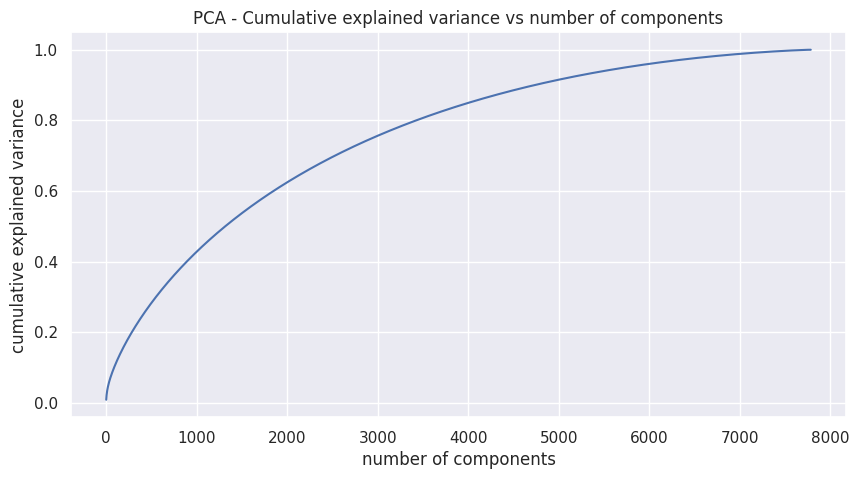

In [ ]:
# Explained variance for different number of components
plt.figure(figsize=(10,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('PCA - Cumulative explained variance vs number of components')
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')


In [ ]:
# reducing the dimensions to 4000 using pca
pca = PCA(n_components=4000,random_state=40)
pca.fit(X)

PCA(n_components=4000, random_state=40)

In [ ]:
# transformed features
x_pca = pca.transform(X)
# shape of transformed vectors
x_pca.shape

(7787, 4000)

# **Applying Clustering Algorithms**

**Clustering**: -

Clustering can be considered the most important unsupervised learning problem; so, as every other problem of this kind, it deals with finding a structure in a collection of unlabeled data.A loose definition of clustering could be “the process of organizing objects into groups whose members are similar in some way”.A cluster is therefore a collection of objects which are “similar” between them and are “dissimilar” to the objects belonging to other clusters.

# 1.K-Means Clustering:

Text(0, 0.5, 'WCSS')

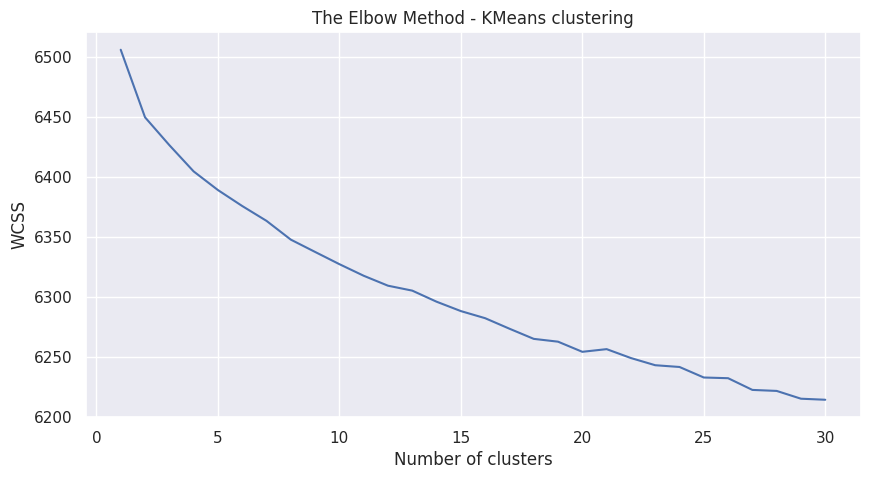

In [ ]:
# Elbow method to find the optimal value of k
wcss=[]
for i in range(1,31):
  kmeans = KMeans(n_clusters=i,init='k-means++',random_state=33)
  kmeans.fit(x_pca)
  wcss_iter = kmeans.inertia_
  wcss.append(wcss_iter)

number_clusters = range(1,31)
plt.figure(figsize=(10,5))
plt.plot(number_clusters,wcss)
plt.title('The Elbow Method - KMeans clustering')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')


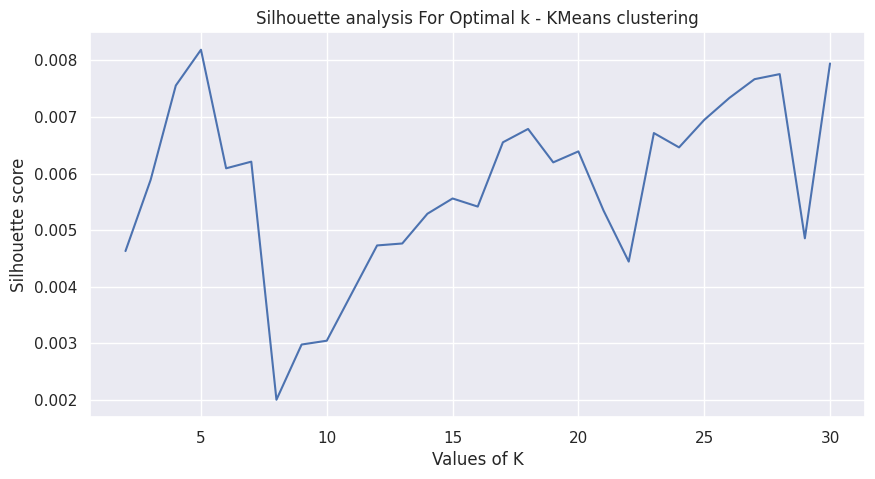

In [ ]:
 # Plotting Silhouette score for different umber of clusters
range_n_clusters = range(2,31)
silhouette_avg = []
for num_clusters in range_n_clusters:
  # initialize kmeans
  kmeans = KMeans(n_clusters=num_clusters,init='k-means++',random_state=33)
  kmeans.fit(x_pca)
  cluster_labels = kmeans.labels_

  # silhouette score
  silhouette_avg.append(silhouette_score(x_pca, cluster_labels))

plt.figure(figsize=(10,5))
plt.plot(range_n_clusters,silhouette_avg)
plt.xlabel('Values of K')
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k - KMeans clustering')
plt.show()

In [ ]:
# Clustering the data into 19 clusters
kmeans = KMeans(n_clusters=6,init='k-means++',random_state=40)
kmeans.fit(x_pca)


KMeans(n_clusters=6, random_state=40)

In [ ]:
# Adding a kmeans cluster number attribute
Dataset['kmeans_cluster'] = kmeans.labels_


In [ ]:
# Evaluation metrics - distortion, Silhouette score
kmeans_distortion = kmeans.inertia_
kmeans_silhouette_score = silhouette_score(x_pca, kmeans.labels_)

print((kmeans_distortion,kmeans_silhouette_score))

(6375.856847829351, 0.008845692725243349)


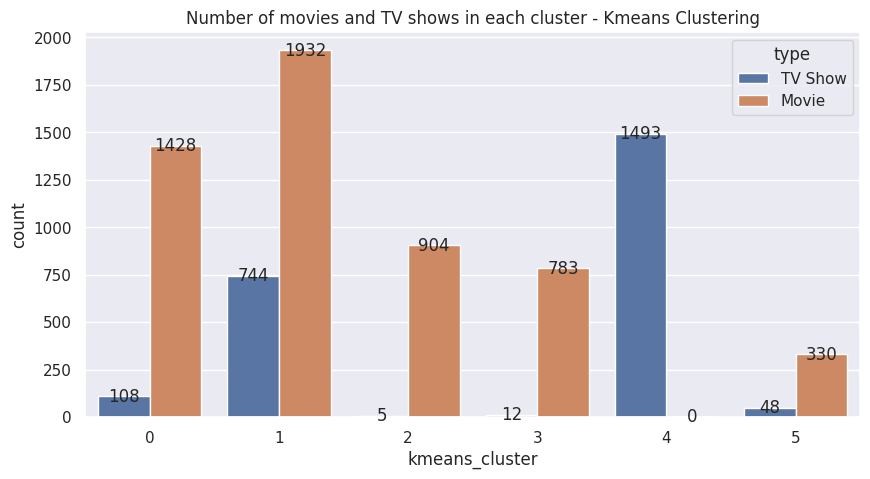

In [ ]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(10,5))
q = sns.countplot(x='kmeans_cluster',data=Dataset, hue='type')
plt.title('Number of movies and TV shows in each cluster - Kmeans Clustering')
for i in q.patches:
  q.annotate(format(i.get_height(), '.0f'), (i.get_x() + i.get_width() / 2., i.get_height()), ha = 'center', va = 'center')

In [ ]:
# Building a wordcloud for the movie descriptions
def kmeans_worldcloud(cluster_num):
  comment_words = ''
  stopwords = set(STOPWORDS)

  # iterate through the csv file
  for val in Dataset[Dataset['kmeans_cluster']==cluster_num].description.values:

      # typecaste each val to string
      val = str(val)

      # split the value
      tokens = val.split()

      # Converts each token into lowercase
      for i in range(len(tokens)):
          tokens[i] = tokens[i].lower()

      comment_words += " ".join(tokens)+" "

  wordcloud = WordCloud(width = 700, height = 700,
                  background_color ='white',
                  stopwords = stopwords,
                  min_font_size = 10).generate(comment_words)


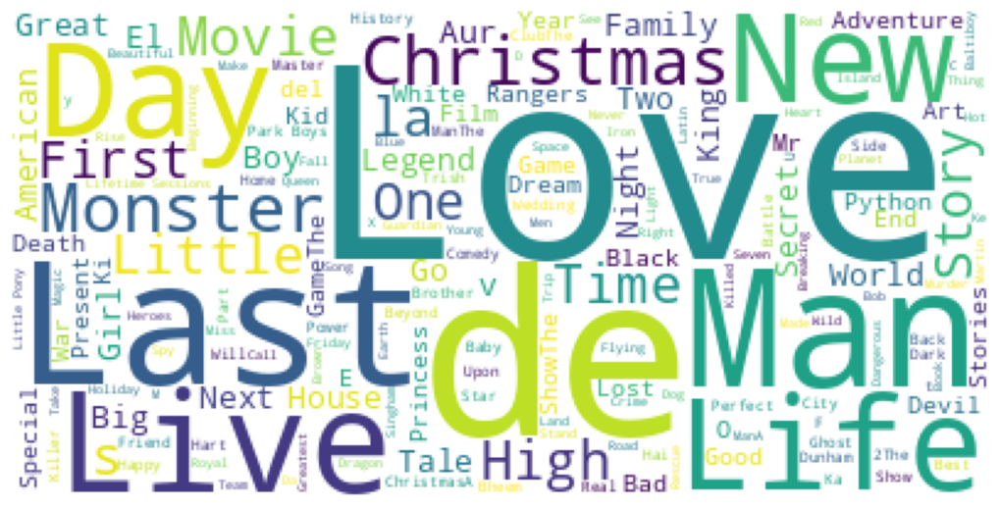

In [ ]:
plt.figure(figsize = (10,5), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)

# Hierarchical clustering:

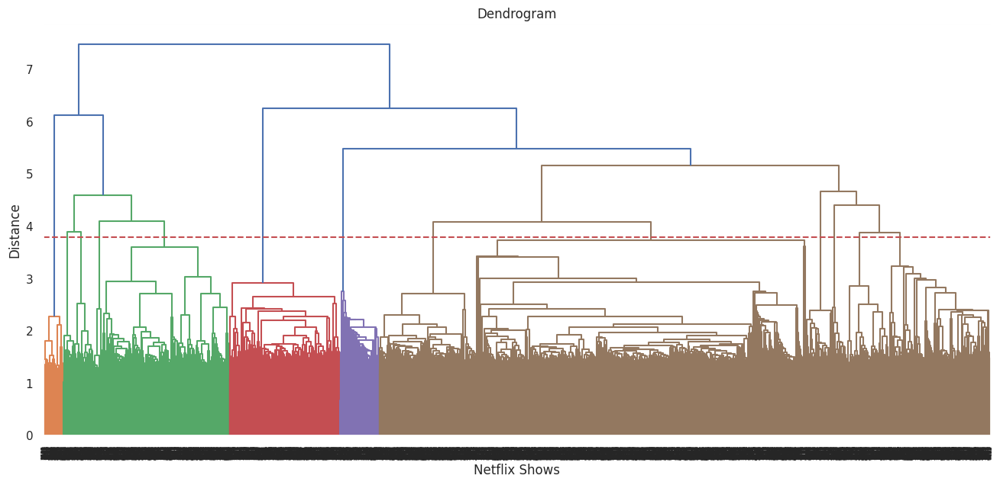

In [ ]:
# Building a dendogram to decide on the number of clusters
plt.figure(figsize=(16, 7))
dend = shc.dendrogram(shc.linkage(x_pca, method='ward'))
plt.title('Dendrogram')
plt.xlabel('Netflix Shows')
plt.ylabel('Distance')
plt.axhline(y= 3.8, color='r', linestyle='--')

In [ ]:
# Fitting hierarchical clustering model
hierarchical = AgglomerativeClustering(n_clusters=12, affinity='euclidean', linkage='ward')
hierarchical.fit_predict(x_pca)

array([ 0,  0,  1, ..., 10,  2, 10])

In [ ]:
# Adding a kmeans cluster number attribute
Dataset['hierarchical_cluster'] = hierarchical.labels_

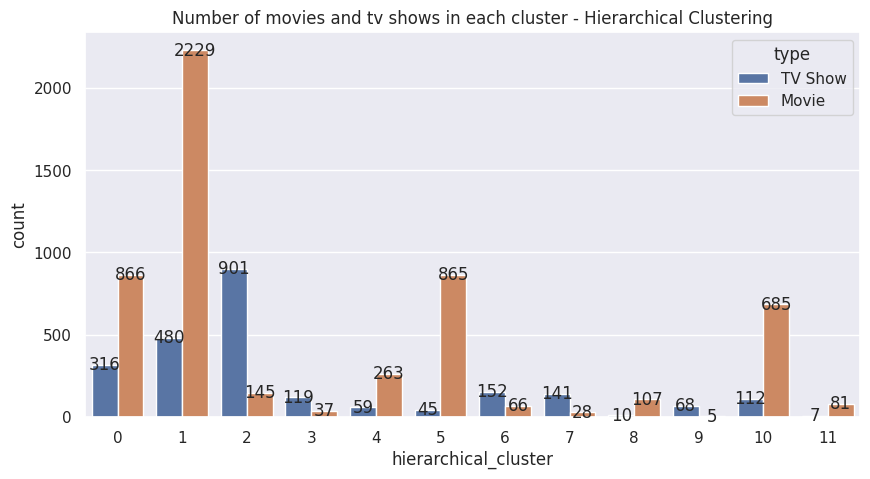

In [ ]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(10,5))
q = sns.countplot(x='hierarchical_cluster',data=Dataset, hue='type')
plt.title('Number of movies and tv shows in each cluster - Hierarchical Clustering')
for i in q.patches:
  q.annotate(format(i.get_height(), '.0f'), (i.get_x() + i.get_width() / 2., i.get_height()), ha = 'center', va = 'center')

In [ ]:
# Building a wordcloud for the movie descriptions
def hierarchical_worldcloud(cluster_num):
  comment_words = ''
  stopwords = set(STOPWORDS)

  # iterate through the csv file
  for val in Dataset[Dataset['hierarchical_cluster']==cluster_num].description.values:

      # typecaste each val to string
      val = str(val)

      # split the value
      tokens = val.split()

      # Converts each token into lowercase
      for i in range(len(tokens)):
          tokens[i] = tokens[i].lower()

      comment_words += " ".join(tokens)+" "

  wordcloud = WordCloud(width = 700, height = 700,
                  background_color ='white',
                  stopwords = stopwords,
                  min_font_size = 10).generate(comment_words)
  return hierarchical_worldcloud

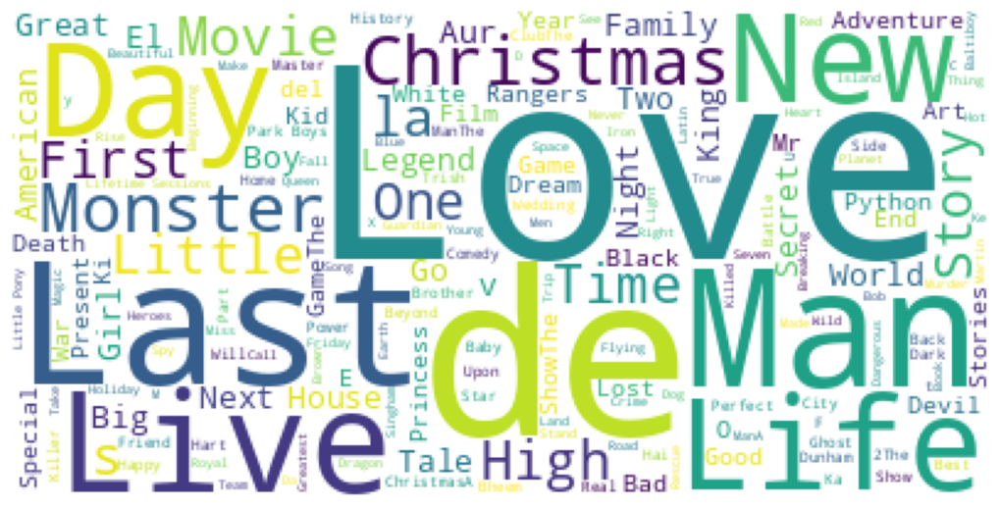

In [ ]:
 # plot the WordCloud image
plt.figure(figsize = (10,5), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)

# **Using Content based recommender system**

In [ ]:
# Changing the index of the df from show id to show title
Dataset['show_id'] = Dataset.index


In [ ]:
# converting tokens to string
def convert(lst):
  return ' '.join(lst)

Dataset['clustering'] = Dataset['clustering'].apply(lambda x: convert(x))

In [ ]:
# setting title of movies/Tv shows as index
Dataset.set_index('title',inplace=True)

In [ ]:
# Count vectorizer
CV = CountVectorizer()
converted_matrix = CV.fit_transform(Dataset['clustering'])



In [ ]:
# Cosine similarity
cosine_similarity = cosine_similarity(converted_matrix)

# Dataset Rows & Columns count
cosine_similarity.shape

(7787, 7787)

In [ ]:
# Developing a function to get 10 recommendations for a show
indices = pd.Series(Dataset.index)

def Dataset_10(title, cosine_sim = cosine_similarity):
  try:
    recommend_content = []
    idx = indices[indices == title].index[0]
    series = pd.Series(cosine_sim[idx]).sort_values(ascending = False)
    top10 = list(series.iloc[1:11].index)
    # list with the titles of the best 10 matching movies
    for i in top10:
      recommend_content.append(list(Dataset.index)[i])
    print("If you liked '"+title+"', you may also enjoy:\n")
    return recommend_content

  except:
    return 'Invalid Entry'

In [ ]:
# Recommendations for 'Peaky Blinders'
Dataset_10('Peaky Blinders')

If you liked 'Peaky Blinders', you may also enjoy:



['Kiss Me First',
 'Happy Valley',
 'London Spy',
 'The Frankenstein Chronicles',
 'Paranoid',
 'Get Even',
 'Giri / Haji',
 'My Hotter Half',
 'The Murder Detectives',
 'I AM A KILLER: RELEASED']

In [ ]:
#recommendations for 'Stranger Things'
Dataset_10('Stranger Things')

If you liked 'Stranger Things', you may also enjoy:



['Beyond Stranger Things',
 'Prank Encounters',
 'The Umbrella Academy',
 'Haunted',
 'Scream',
 'Warrior Nun',
 'Nightflyers',
 'Zombie Dumb',
 'Kiss Me First',
 'The Vampire Diaries']

In [ ]:
#recommendations for'Zindagi Na Milegi Dobara'
Dataset_10('Zindagi Na Milegi Dobara')

If you liked 'Zindagi Na Milegi Dobara', you may also enjoy:



['Dil Dhadakne Do',
 'Luck by Chance',
 'Zero',
 'Shanghai',
 'Dev.D',
 'Dhh',
 'Cycle',
 'Saath Saath',
 'Lakshya',
 'Kabhi Haan Kabhi Naa']

**Inference**:

*   here we create recommendation system based on genre of content in netflix
*   These recommendation system suggests us best movies in netflix according to our recent interest. It will defnetly increases watch time, content retention and hugely positively impacts netflix business with more profitability and business opportunity.



# **Future scope**

We could have done more research on recommendation system.

Integrate Netflix dataset with other data set and present more insights and clusters.

We can do more Post Cluster Analysis.

We can get more insight and analysis from dataset.

# **Conclusion**


1.   In dataset we got 2389 null values in director, 718 in cast, 507 in country, 10 in date_added, 7 in rating column. after analyzing type column we got netflix has more movies than tv shows.(69% movies and 31% tv shows)
2.   The dataset contained about 7787 records, and 12 attributes. We began by dealing with the dataset's missing values and doing exploratory data analysis (EDA).
3.It was found that Netflix hosts more movies than TV shows on its platform, and the total number of shows added on Netflix is growing exponentially. Also, majority of the shows were produced in the United States, and the majority of the shows on Netflix were created for adults and young adults age group.
4. Title column we got 'Love','Man','World','Story','Life' seems very common word.overwhelming number of content having 'Christmas'also.We are suspecting "Christmas" titles to be a very seasonal thing with most of the shows likely to be released during the month of December.
5.Anupam Kher is the most popular actor in netflix followed by sharukhkhan, nashiruddin shah,om puri,akshay kumar etc.
6.From country column we can find that The United States stands out on top since Netflix is an American company.
India comes in second followed by the UK and Canada.
7.After analyzing date-added column we find 2018 has highest movie counts in netflix followed by 2017,2016,2015 etc.
year by year movie counts are increasing it defines public likes netflix content year by year and new public joins netflix. so it defines sustainable growth of netflix.
8.From duration column we got Most movies in netflix have 70-120 min duration and Most of the tv shows are 1 to 2 seasons long.
9.from listed_in column we have created genres.from genres we can see that International Movies,Dramas,Comedies,International Tv shows are most popular genres on netflix.
10.TV thrillers, tv shows, classic & cult shows these are very bad genres and allmost no popularity. Even though the United States has the most content available, it looks like Netflix has decided to release a ton of international movies.
11.From country vs type trend we find most countries preferred movies over tv shows in netflix .
It concludes that to expand their business netflix should produce more tv shows and must increase the quality of movies as it is their most popular type
12.Once obtained the required insights from the EDA, we start with Pre-processing the text data by removing the punctuation, and, stop words. This filtered data is passed through TF - IDF Vectorizer since we are conducting a text-based clustering and the model needs the data to be vectorized in order to predict the desired results.
13.Through TFIDF Vectorization, we created a total of 20000 attributes. We used Principal Component Analysis (PCA) to handle the curse of dimensionality. 4000 components were able to capture more than 80% of variance, and hence, the number of components were restricted to 4000. We first built clusters using the k-means clustering algorithm, and the optimal number of clusters came out to be 6. This was obtained through the elbow method and Silhouette score analysis.
14..Then clusters were built using the Agglomerative clustering algorithm, and the optimal number of clusters came out to be 12. This was obtained after visualizing the dendrogram.
15..A content based recommender system was built using the similarity matrix obtained after using cosine similarity. This recommender system will make 10 recommendations to the user based on the type of show they watched.





